# Capstone Project - HealthCare

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
%matplotlib inline

from sklearn.datasets import make_classification
from imblearn.over_sampling import ADASYN, SMOTE

In [2]:
#Reading the file
hc_df = pd.read_csv('health care diabetes.csv')

### Data Exploration

**1. Perform descriptive analysis. Understand the variables and 
their corresponding values. On the columns below, a value of 
zero does not make sense and thus indicates missing value:
 • Glucose
 • BloodPressure
 • SkinThickness
 • Insulin
 • BMI.**

In [3]:
hc_df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
hc_df.shape

(768, 9)

In [5]:
hc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [6]:
 hc_df.isnull().sum(axis=0)

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [7]:
hc_df.nunique()

Pregnancies                  17
Glucose                     136
BloodPressure                47
SkinThickness                51
Insulin                     186
BMI                         248
DiabetesPedigreeFunction    517
Age                          52
Outcome                       2
dtype: int64

In [8]:
hc_df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


#### Checking for 0s in the data

#### for  Glucose, BloodPressure, SkinThickness, Insulin, BMI.

In [9]:
hc_df[hc_df.Glucose == 0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
75,1,0,48,20,0,24.7,0.140,22,0
182,1,0,74,20,23,27.7,0.299,21,0
342,1,0,68,35,0,32.0,0.389,22,0
349,5,0,80,32,0,41.0,0.346,37,1
502,6,0,68,41,0,39.0,0.727,41,1


In [10]:
hc_df[hc_df.BloodPressure == 0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
7,10,115,0,0,0,35.3,0.134,29,0
15,7,100,0,0,0,30.0,0.484,32,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
78,0,131,0,0,0,43.2,0.270,26,1
81,2,74,0,0,0,0.0,0.102,22,0
172,2,87,0,23,0,28.9,0.773,25,0
193,11,135,0,0,0,52.3,0.578,40,1
222,7,119,0,0,0,25.2,0.209,37,0
261,3,141,0,0,0,30.0,0.761,27,1


In [11]:
hc_df[hc_df.SkinThickness == 0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
2,8,183,64,0,0,23.3,0.672,32,1
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
9,8,125,96,0,0,0.0,0.232,54,1
10,4,110,92,0,0,37.6,0.191,30,0
...,...,...,...,...,...,...,...,...,...
757,0,123,72,0,0,36.3,0.258,52,1
758,1,106,76,0,0,37.5,0.197,26,0
759,6,190,92,0,0,35.5,0.278,66,1
762,9,89,62,0,0,22.5,0.142,33,0


In [12]:
hc_df[hc_df.Insulin == 0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
...,...,...,...,...,...,...,...,...,...
761,9,170,74,31,0,44.0,0.403,43,1
762,9,89,62,0,0,22.5,0.142,33,0
764,2,122,70,27,0,36.8,0.340,27,0
766,1,126,60,0,0,30.1,0.349,47,1


In [13]:
hc_df[hc_df.BMI == 0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
9,8,125,96,0,0,0.0,0.232,54,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
81,2,74,0,0,0,0.0,0.102,22,0
145,0,102,75,23,0,0.0,0.572,21,0
371,0,118,64,23,89,0.0,1.731,21,0
426,0,94,0,0,0,0.0,0.256,25,0
494,3,80,0,0,0,0.0,0.174,22,0
522,6,114,0,0,0,0.0,0.189,26,0
684,5,136,82,0,0,0.0,0.640,69,0


**2. Visually explore these variables using histograms. Treat the missing values 
accordingly.**

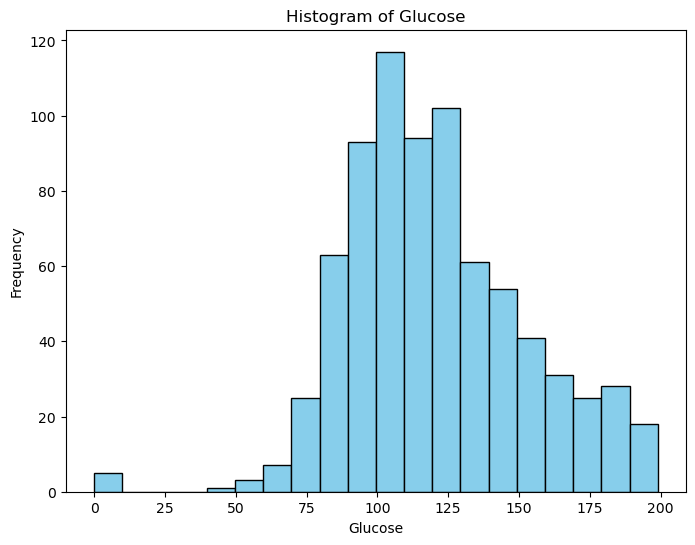

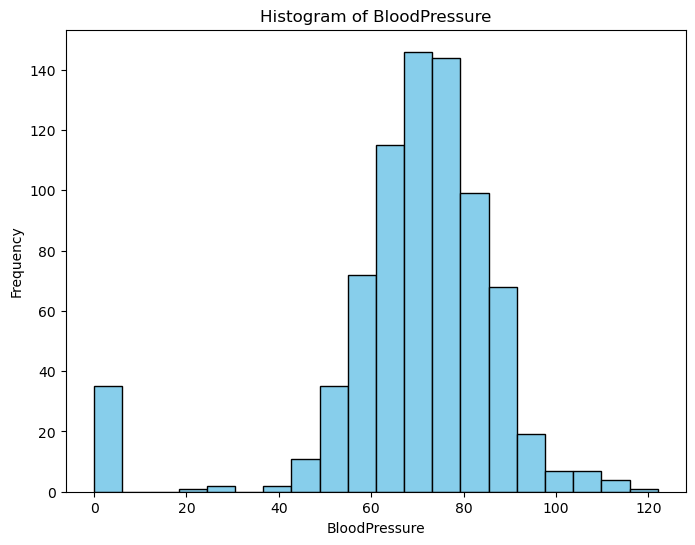

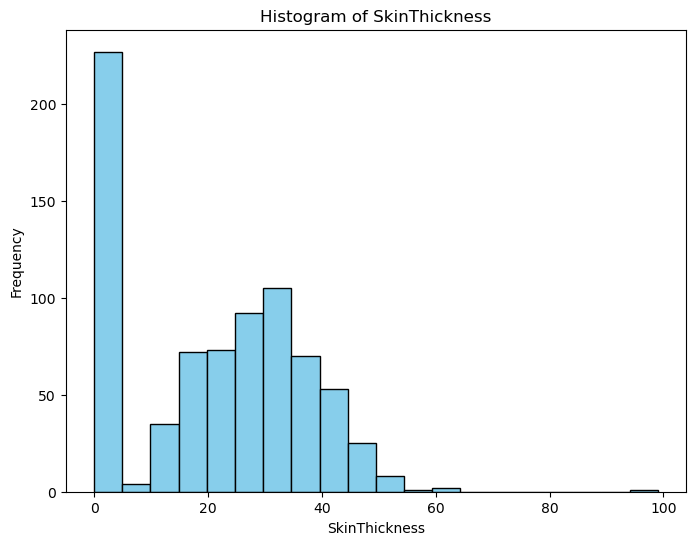

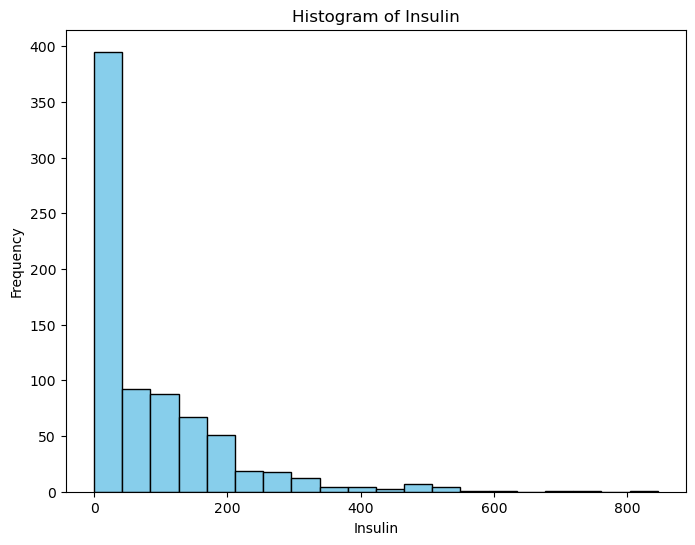

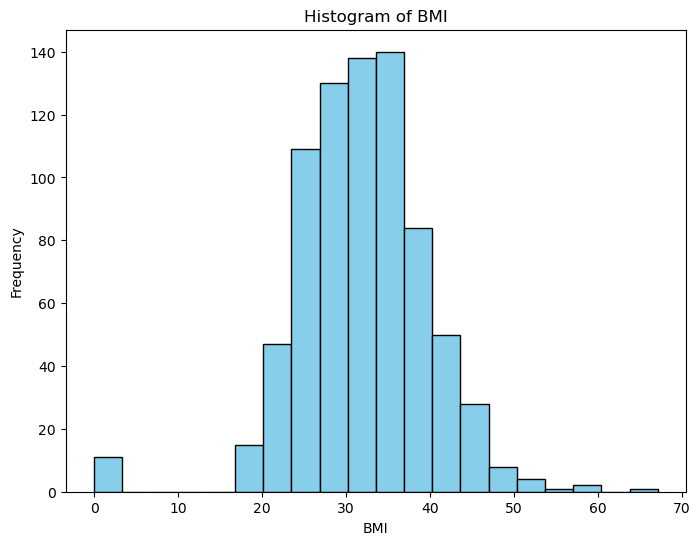

In [14]:
cols_to_plot = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']

for col in cols_to_plot:
    plt.figure(figsize=(8, 6))
    plt.hist(hc_df[col], bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

In [15]:
print('Check for percentage of 0s in the data, column wise')
print(hc_df[hc_df.BloodPressure == 0].shape[0]*100/hc_df.shape[0])
print(hc_df[hc_df.SkinThickness == 0].shape[0]*100/hc_df.shape[0])
print(hc_df[hc_df.Insulin == 0].shape[0]*100/hc_df.shape[0])

Check for percentage of 0s in the data, column wise
4.557291666666667
29.557291666666668
48.697916666666664


As we can see from the data and the graph BloodPressure, SkinThickness and Insulin have more number of 0s, we can't remove them as the data size is 768. If we remove half the data will be gone. So imputing the 0s with mean and median  based on the data variable.

Check for 0s again to make sure they are imputed

In [16]:
hc_df.Glucose = hc_df.Glucose.replace(0,hc_df.Glucose.mean())
hc_df[hc_df.Glucose==0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


In [17]:
hc_df.BloodPressure = hc_df.BloodPressure.replace(0,hc_df.BloodPressure.mean())
hc_df[hc_df.BloodPressure==0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


In [18]:
print(hc_df.SkinThickness.median(),hc_df.SkinThickness.mean())
hc_df.SkinThickness = hc_df.SkinThickness.replace(0,hc_df.SkinThickness.median())
hc_df[hc_df.SkinThickness==0]

23.0 20.536458333333332


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


In [19]:
print(hc_df.Insulin.median(),hc_df.Insulin.mean())
hc_df.Insulin = hc_df.Insulin.replace(0,hc_df.Insulin.median())
hc_df[hc_df.Insulin==0]

30.5 79.79947916666667


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


In [20]:
hc_df.BMI = hc_df.BMI.replace(0,hc_df.BMI.mean())
hc_df[hc_df.BMI==0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome


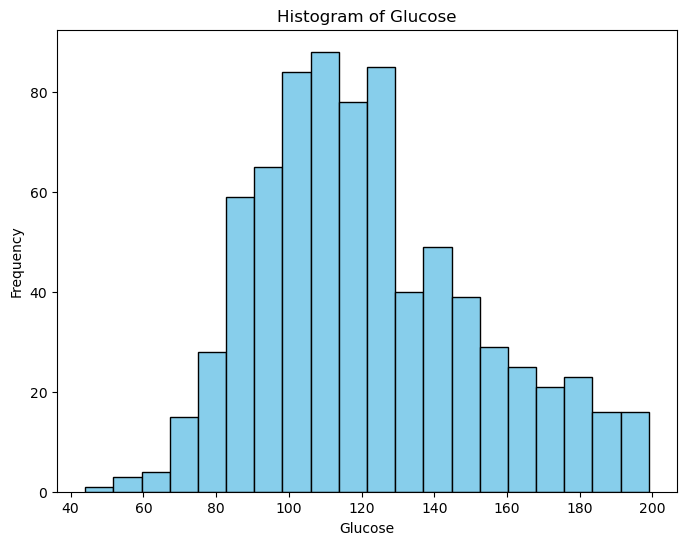

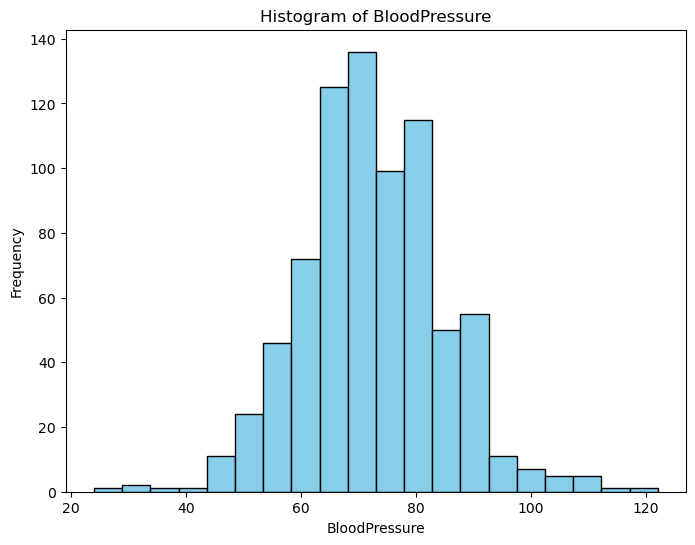

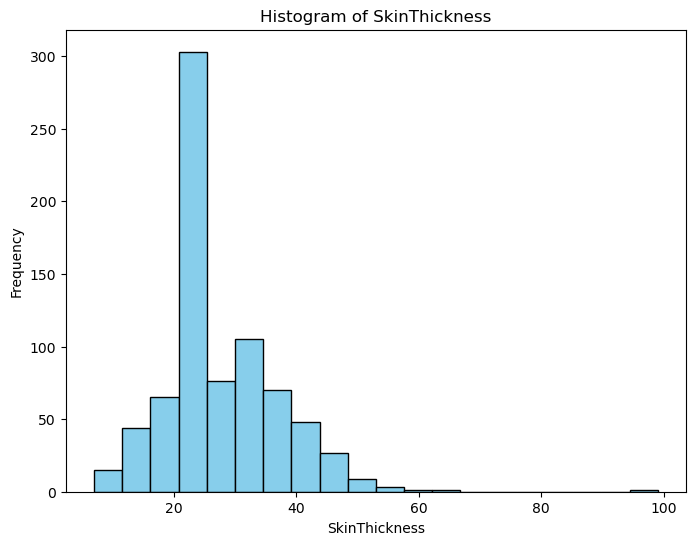

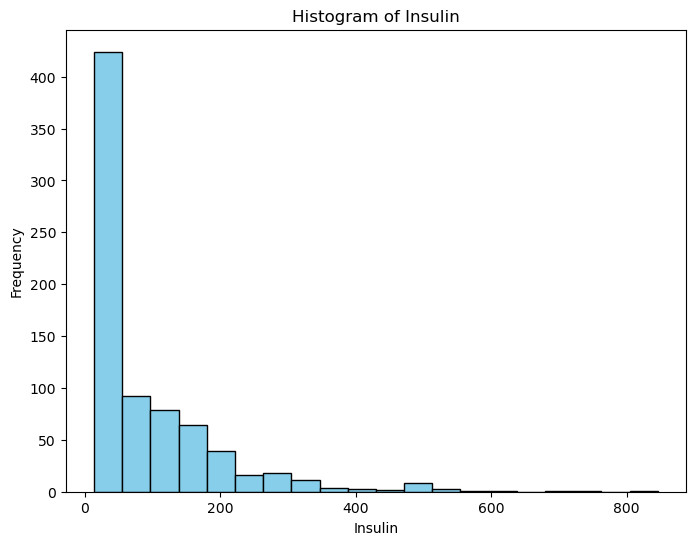

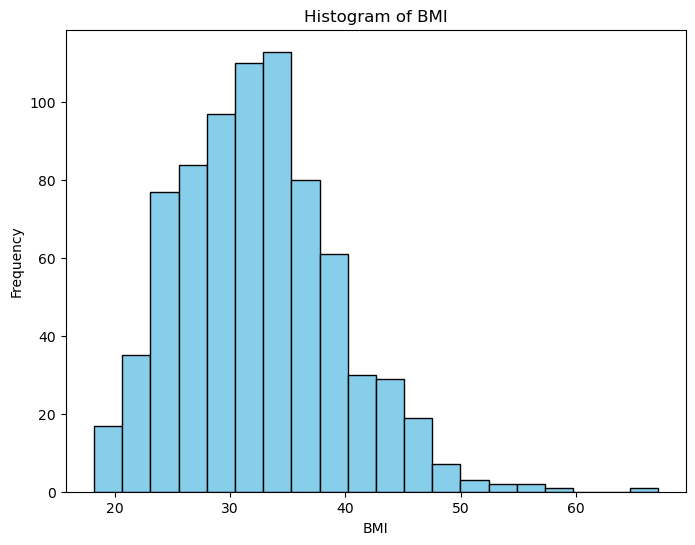

In [21]:
for col in cols_to_plot:
    plt.figure(figsize=(8, 6))
    plt.hist(hc_df[col], bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

**3. There are integer and float data type variables in this dataset. Create a count 
(frequency) plot describing the data types and the count of variables.**

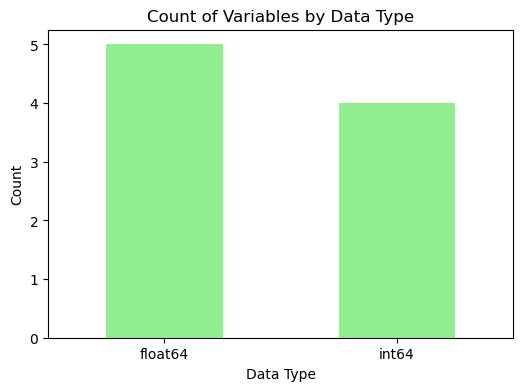

In [22]:
data_types_count = hc_df.dtypes.value_counts()

# Create a count plot to visualize the data types.
plt.figure(figsize=(6, 4))
data_types_count.plot(kind='bar', color='lightgreen')
plt.title('Count of Variables by Data Type')
plt.xlabel('Data Type')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

**4. Check the balance of the data by plotting the count of outcomes by their 
value. Describe your findings and plan future course of action.**

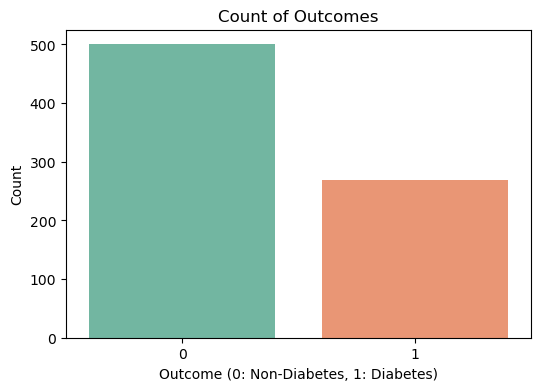

0    500
1    268
Name: Outcome, dtype: int64


In [23]:
# Count the occurrences of each outcome in the 'Outcome' column.
outcome_counts = hc_df.Outcome.value_counts()

# Create a count plot to visualize the outcome distribution.
plt.figure(figsize=(6, 4))
sns.countplot(data=hc_df, x='Outcome', palette='Set2')
plt.title('Count of Outcomes')
plt.xlabel('Outcome (0: Non-Diabetes, 1: Diabetes)')
plt.ylabel('Count')
plt.show()

# Describe your findings
print(outcome_counts)

The data is imbalacned as the count of Non Diabetes is alomst double the count the of Diabetes

For imbalanced data we can oversample the minority data or undersample the majority data. Random forests are also great to use for these situations. We will try with Random Forest first and see how it turns out.

**5. Create scatter charts between the pair of variables to understand the 
relationships. Describe your findings.**

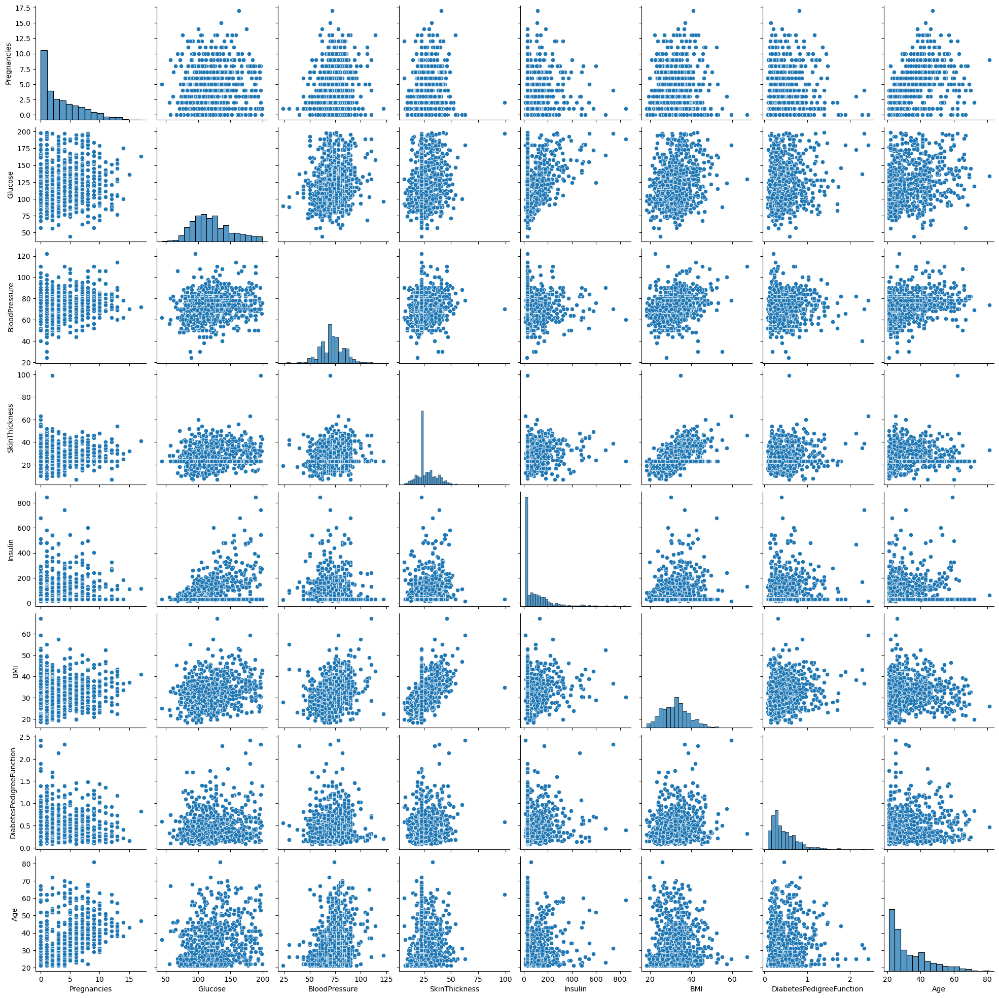

In [24]:
# Define the variables you want to include in the pair plot
pair_plot_cols = hc_df.columns[:-1]

# Create a pair plot
sns.pairplot(hc_df[pair_plot_cols], diag_kind='hist')
plt.show()

Using a box plot to  see the correltation, we cant see much relation between variables, as the scatter is spread widely and not in a narrow way as we anticipate

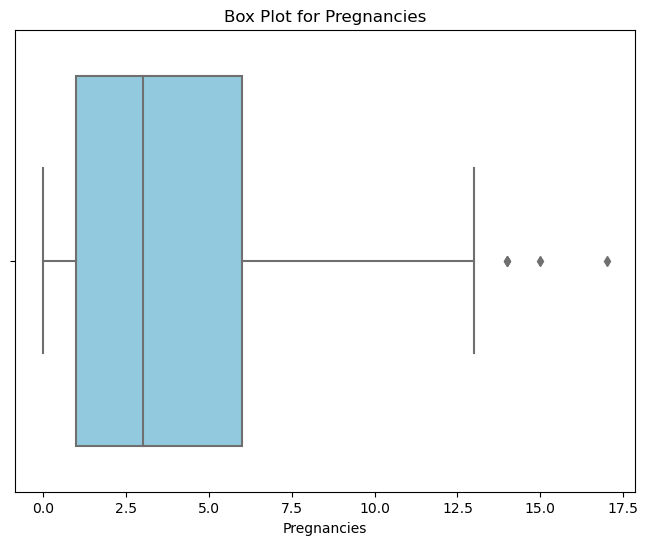

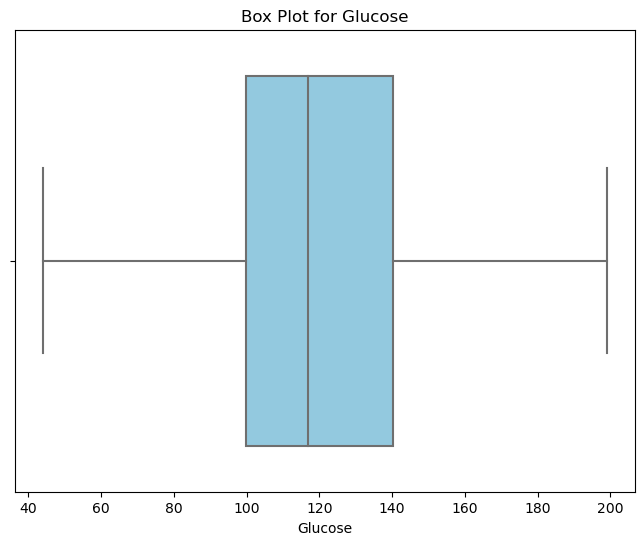

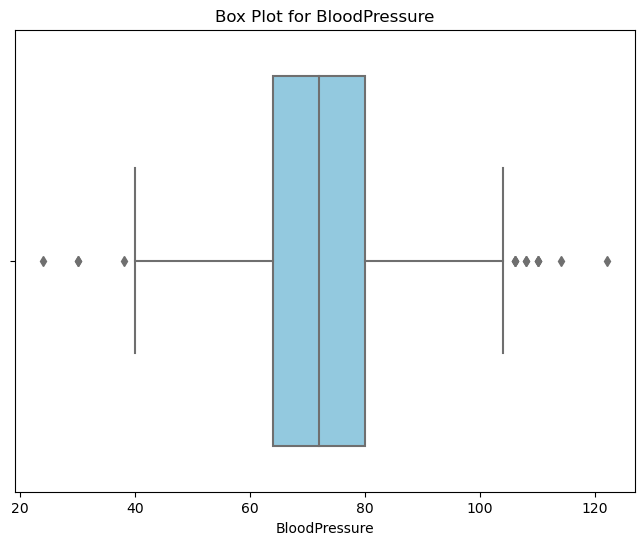

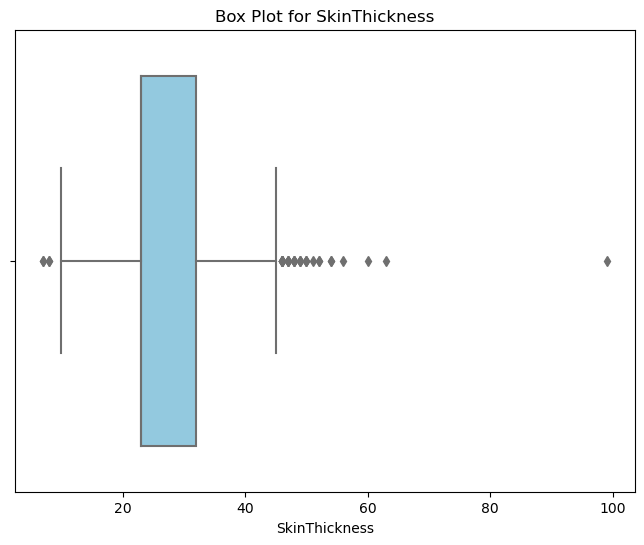

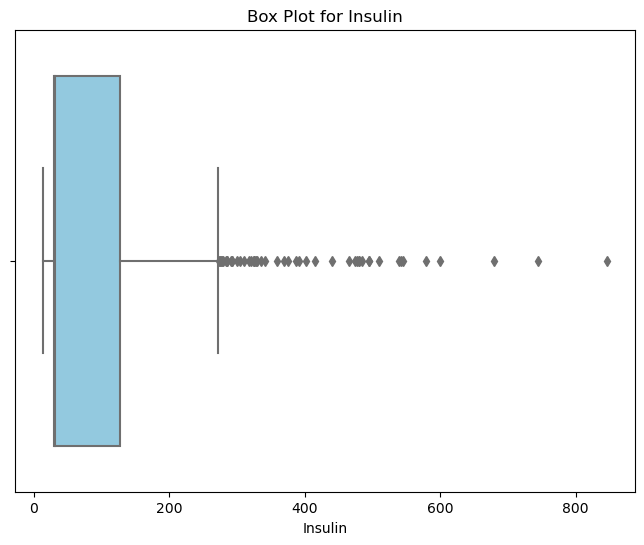

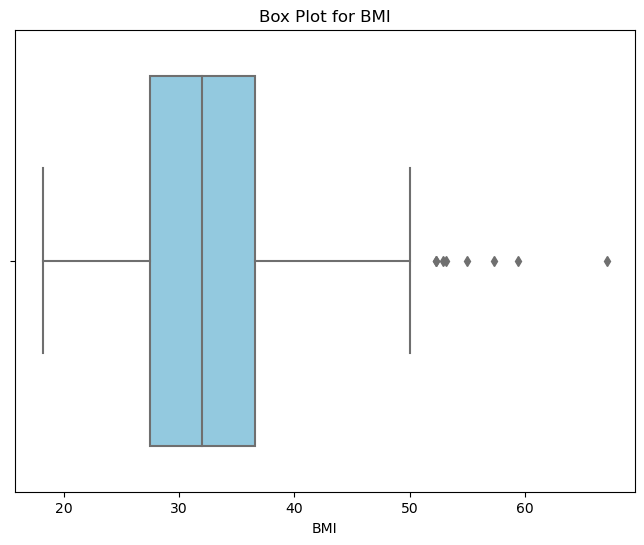

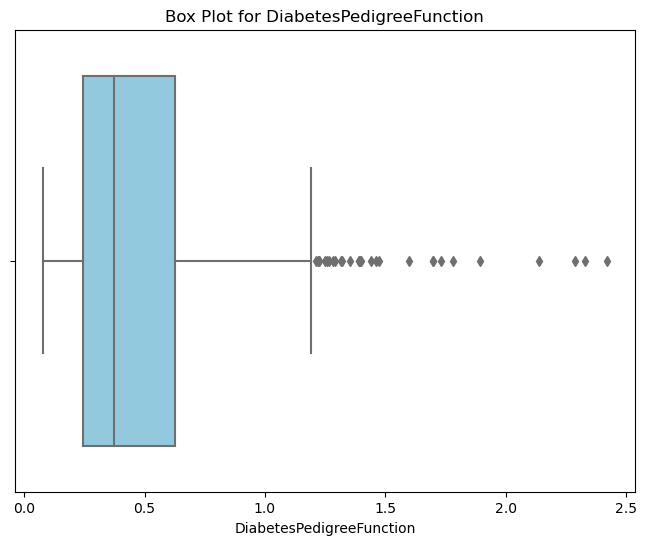

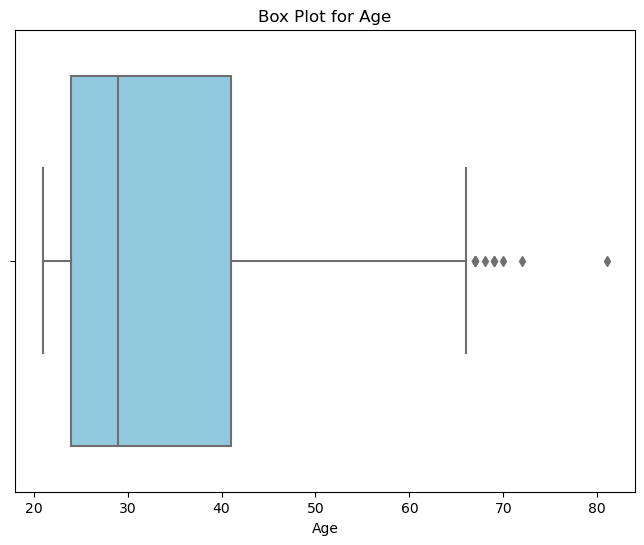

In [25]:
# Create a box plot for each variable in the list
for var in pair_plot_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=hc_df[var], color='skyblue')
    plt.title(f'Box Plot for {var}')
    plt.xlabel(var)
    plt.show()

Usign IQR method to find out the number of outliers and their indices

In [26]:
outlier_ind_list = []
for var in pair_plot_cols:
    Q1 = hc_df[var].quantile(0.25)
    Q3 = hc_df[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliier_ind = list(hc_df[(hc_df[var] < lower_bound) | (hc_df[var] > upper_bound)].index)
#     low_ind = list(hc_df[hc_df[var] < lower_bound].index)
#     up_ind = list(hc_df[hc_df[var] > upper_bound].index)
#     tot_ind = low_ind + up_ind
    if len(outliier_ind)>0:
        outlier_ind_list.append(outliier_ind)
outlier_ind_list

[[88, 159, 298, 455],
 [18, 43, 84, 106, 125, 177, 362, 549, 597, 599, 658, 662, 672, 691],
 [16,
  39,
  57,
  86,
  99,
  120,
  150,
  177,
  211,
  254,
  273,
  275,
  370,
  382,
  409,
  422,
  428,
  434,
  445,
  458,
  519,
  532,
  539,
  575,
  579,
  580,
  591,
  625,
  657,
  662,
  663,
  689,
  693,
  718,
  763],
 [8,
  13,
  53,
  54,
  56,
  111,
  139,
  144,
  153,
  162,
  186,
  199,
  206,
  220,
  228,
  231,
  247,
  248,
  258,
  279,
  286,
  296,
  360,
  364,
  370,
  375,
  388,
  392,
  395,
  409,
  412,
  415,
  425,
  480,
  486,
  519,
  561,
  574,
  584,
  606,
  612,
  645,
  655,
  695,
  707,
  710,
  713,
  715,
  753],
 [120, 125, 177, 193, 247, 303, 445, 673],
 [4,
  12,
  39,
  45,
  58,
  100,
  147,
  187,
  218,
  228,
  243,
  245,
  259,
  292,
  308,
  330,
  370,
  371,
  383,
  395,
  445,
  534,
  593,
  606,
  618,
  621,
  622,
  659,
  661],
 [123, 363, 453, 459, 489, 537, 666, 674, 684]]

In [27]:
print(len(outlier_ind_list))
s = 0
for x in outlier_ind_list:
    s += len(x)
    print(s,len(x))
print(s)

7
4 4
18 14
53 35
102 49
110 8
139 29
148 9
148


In [28]:
out_ind_set = set(x for lst in outlier_ind_list for x in lst)
print(len(out_ind_set))
out_ind_set

132


{4,
 8,
 12,
 13,
 16,
 18,
 39,
 43,
 45,
 53,
 54,
 56,
 57,
 58,
 84,
 86,
 88,
 99,
 100,
 106,
 111,
 120,
 123,
 125,
 139,
 144,
 147,
 150,
 153,
 159,
 162,
 177,
 186,
 187,
 193,
 199,
 206,
 211,
 218,
 220,
 228,
 231,
 243,
 245,
 247,
 248,
 254,
 258,
 259,
 273,
 275,
 279,
 286,
 292,
 296,
 298,
 303,
 308,
 330,
 360,
 362,
 363,
 364,
 370,
 371,
 375,
 382,
 383,
 388,
 392,
 395,
 409,
 412,
 415,
 422,
 425,
 428,
 434,
 445,
 453,
 455,
 458,
 459,
 480,
 486,
 489,
 519,
 532,
 534,
 537,
 539,
 549,
 561,
 574,
 575,
 579,
 580,
 584,
 591,
 593,
 597,
 599,
 606,
 612,
 618,
 621,
 622,
 625,
 645,
 655,
 657,
 658,
 659,
 661,
 662,
 663,
 666,
 672,
 673,
 674,
 684,
 689,
 691,
 693,
 695,
 707,
 710,
 713,
 715,
 718,
 753,
 763}

It seems that there are 132 outliers. This sees like more in number, better to check with z score as well.

In [29]:
threshold = 3
outlier_indices = {}
for z_var in pair_plot_cols:
    z_scores = stats.zscore(hc_df[z_var])
    outlier_indices[z_var] = [i for i, z in enumerate(z_scores) if z > threshold]
#     print('z<3',(z<3).sum())
#     print('z>3',z_var,(z_scores>3).sum())
#     print((z>3))
outlier_indices

{'Pregnancies': [88, 159, 298, 455],
 'Glucose': [],
 'BloodPressure': [43, 106, 177, 549, 691],
 'SkinThickness': [57, 120, 445, 579],
 'Insulin': [8,
  13,
  111,
  153,
  186,
  220,
  228,
  247,
  286,
  370,
  392,
  409,
  415,
  486,
  584,
  645,
  655,
  695,
  753],
 'BMI': [120, 125, 177, 445, 673],
 'DiabetesPedigreeFunction': [4,
  45,
  58,
  228,
  330,
  370,
  371,
  395,
  445,
  593,
  621],
 'Age': [123, 453, 459, 666, 684]}

In [30]:
outlier_indices.values()

dict_values([[88, 159, 298, 455], [], [43, 106, 177, 549, 691], [57, 120, 445, 579], [8, 13, 111, 153, 186, 220, 228, 247, 286, 370, 392, 409, 415, 486, 584, 645, 655, 695, 753], [120, 125, 177, 445, 673], [4, 45, 58, 228, 330, 370, 371, 395, 445, 593, 621], [123, 453, 459, 666, 684]])

In [31]:
z_out_ind = set(x for lst in outlier_indices.values() for x in lst)
print(len(z_out_ind))
z_out_ind

47


{4,
 8,
 13,
 43,
 45,
 57,
 58,
 88,
 106,
 111,
 120,
 123,
 125,
 153,
 159,
 177,
 186,
 220,
 228,
 247,
 286,
 298,
 330,
 370,
 371,
 392,
 395,
 409,
 415,
 445,
 453,
 455,
 459,
 486,
 549,
 579,
 584,
 593,
 621,
 645,
 655,
 666,
 673,
 684,
 691,
 695,
 753}

From z score, it seems that there are 47 outliers, we will proceed with remvoig these indices

In [32]:
z_out_ind = list(z_out_ind)
type(z_out_ind)

list

In [33]:
hc_df = hc_df.drop(index = z_out_ind)

In [34]:
hc_df.shape

(721, 9)

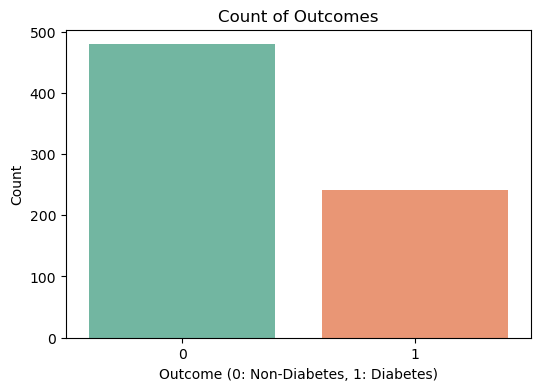

0    479
1    242
Name: Outcome, dtype: int64


In [35]:
# Count the occurrences of each outcome in the 'Outcome' column.
outcome_counts = hc_df.Outcome.value_counts()

# Create a count plot to visualize the outcome distribution.
plt.figure(figsize=(6, 4))
sns.countplot(data=hc_df, x='Outcome', palette='Set2')
plt.title('Count of Outcomes')
plt.xlabel('Outcome (0: Non-Diabetes, 1: Diabetes)')
plt.ylabel('Count')
plt.show()

# Describe your findings
print(outcome_counts)

So we have the final imbalanced data, we need to try to balance it for better model building

Scatter plot between Glucose and Insulin

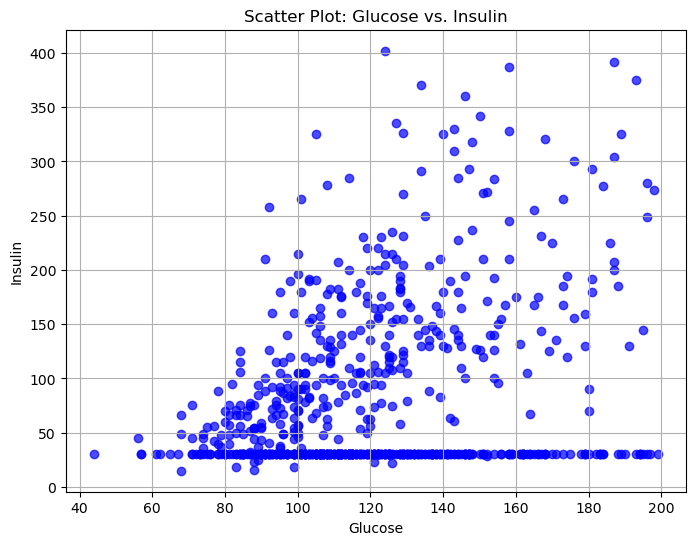

In [36]:
plt.figure(figsize=(8, 6))
plt.scatter(hc_df['Glucose'], hc_df['Insulin'], color='blue', alpha=0.7)
plt.title('Scatter Plot: Glucose vs. Insulin')
plt.xlabel('Glucose')
plt.ylabel('Insulin')
plt.grid(True)
plt.show()

Scatter plot between BMI and Blood Pressure

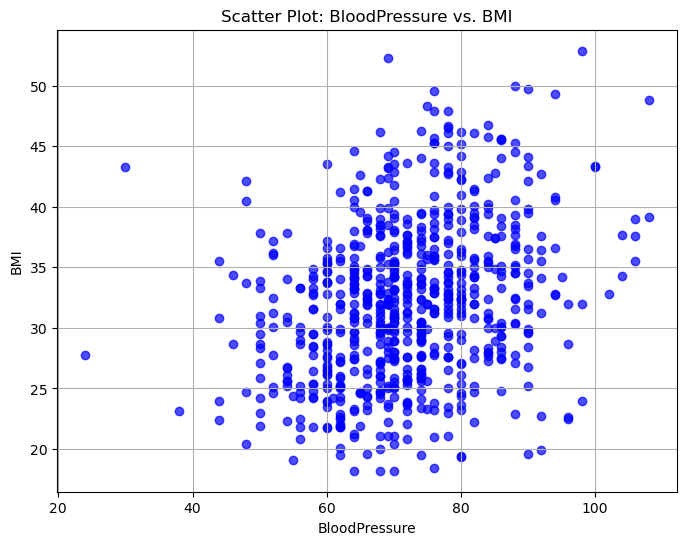

In [37]:
# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(hc_df['BloodPressure'], hc_df['BMI'], color='blue', alpha=0.7)
plt.title('Scatter Plot: BloodPressure vs. BMI')
plt.xlabel('BloodPressure')
plt.ylabel('BMI')
plt.grid(True)
plt.show()

Scatter Plot between Age and BMI

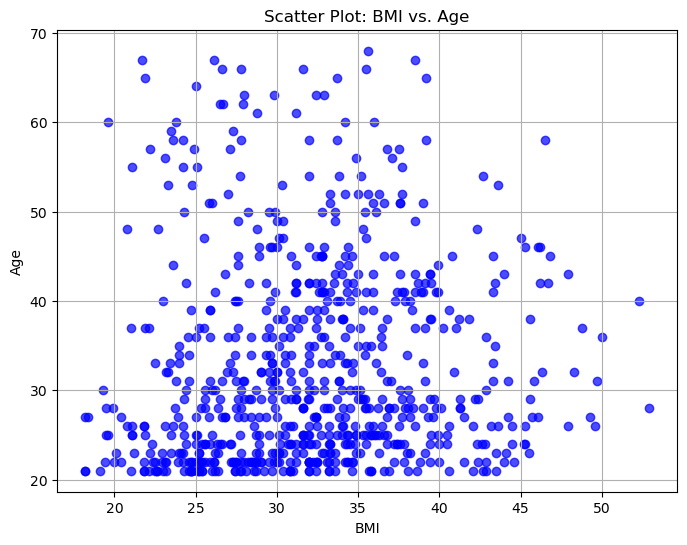

In [38]:
# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(hc_df['BMI'], hc_df['Age'], color='blue', alpha=0.7)
plt.title('Scatter Plot: BMI vs. Age')
plt.xlabel('BMI')
plt.ylabel('Age')
plt.grid(True)
plt.show()

Scatter Plot between Age and BloodPressure

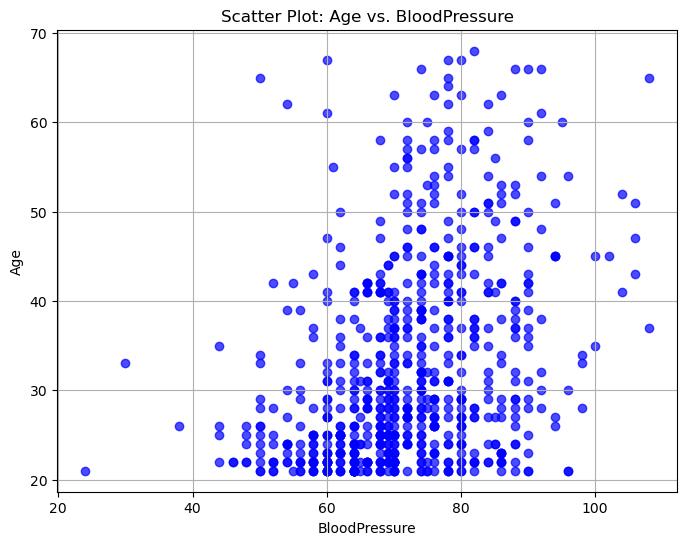

In [39]:
# Scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(hc_df['BloodPressure'], hc_df['Age'], color='blue', alpha=0.7)
plt.title('Scatter Plot: Age vs. BloodPressure')
plt.xlabel('BloodPressure')
plt.ylabel('Age')
plt.grid(True)
plt.show()

Yeah, after plotting the variables individually, we can see that the graphs are more scattered.We cant clearly say these are correlated from the graphs but we insticntly know they could be correlated. Lets do correlation analysis and heatmap

**6. Perform correlation analysis. Visually explore it using a heat map**

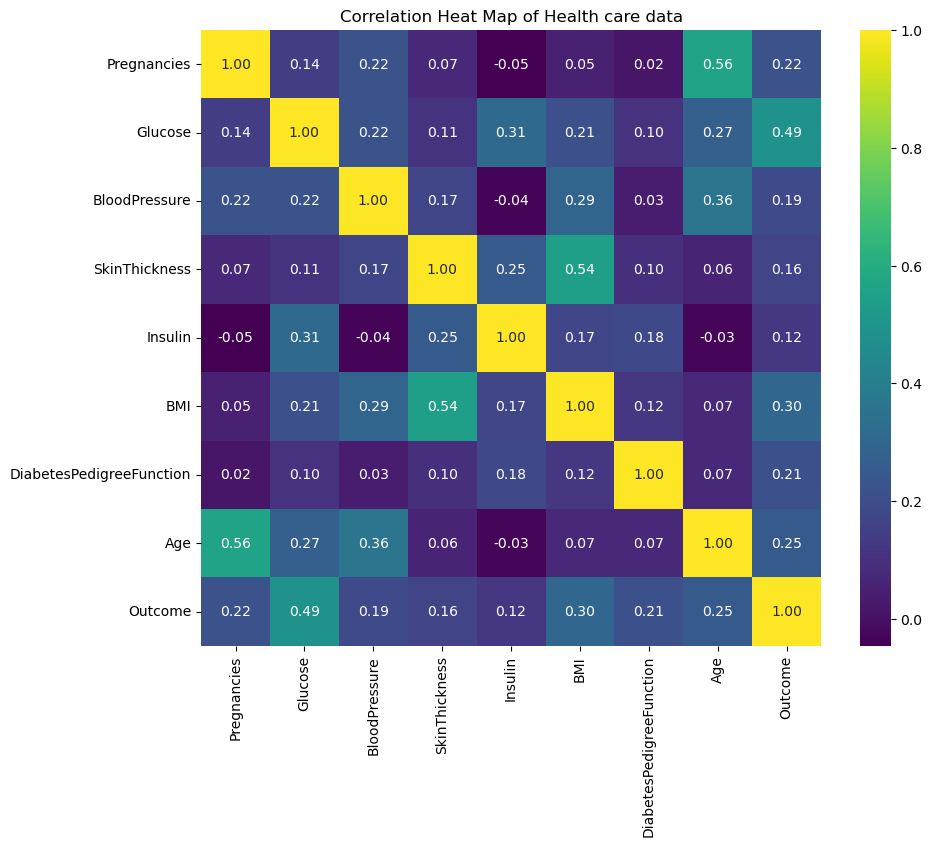

In [40]:
hc_corr_mat = hc_df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(hc_corr_mat, annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heat Map of Health care data')
plt.show()

In [41]:
hc_corr_mat

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.140638,0.221282,0.071965,-0.045408,0.051446,0.015045,0.560438,0.219036
Glucose,0.140638,1.000000,0.224009,0.108315,0.306930,0.209275,0.104596,0.268604,0.488506
BloodPressure,0.221282,0.224009,1.000000,0.169282,-0.036252,0.293199,0.034416,0.360480,0.188471
SkinThickness,0.071965,0.108315,0.169282,1.000000,0.247640,0.539383,0.098129,0.059974,0.164078
Insulin,-0.045408,0.306930,-0.036252,0.247640,1.000000,0.171899,0.180696,-0.031642,0.120371
BMI,0.051446,0.209275,0.293199,0.539383,0.171899,1.000000,0.121618,0.071843,0.301024
DiabetesPedigreeFunction,0.015045,0.104596,0.034416,0.098129,0.180696,0.121618,1.000000,0.069305,0.209656
Age,0.560438,0.268604,0.360480,0.059974,-0.031642,0.071843,0.069305,1.000000,0.246216
Outcome,0.219036,0.488506,0.188471,0.164078,0.120371,0.301024,0.209656,0.246216,1.000000


As we can see, there is not much correaltion between varaibles, there are only 2 variables that show above 0.5, and seems that most variables are not correlated. As we know this is an imbalanced data, maybe after balancing  we might see  some development.

Before balancing the data we will look at clusters to get a clear picture whether to choose SMOTE or ADASYN method of over sampling. Over sampling because we have diabetes outcome as minority.

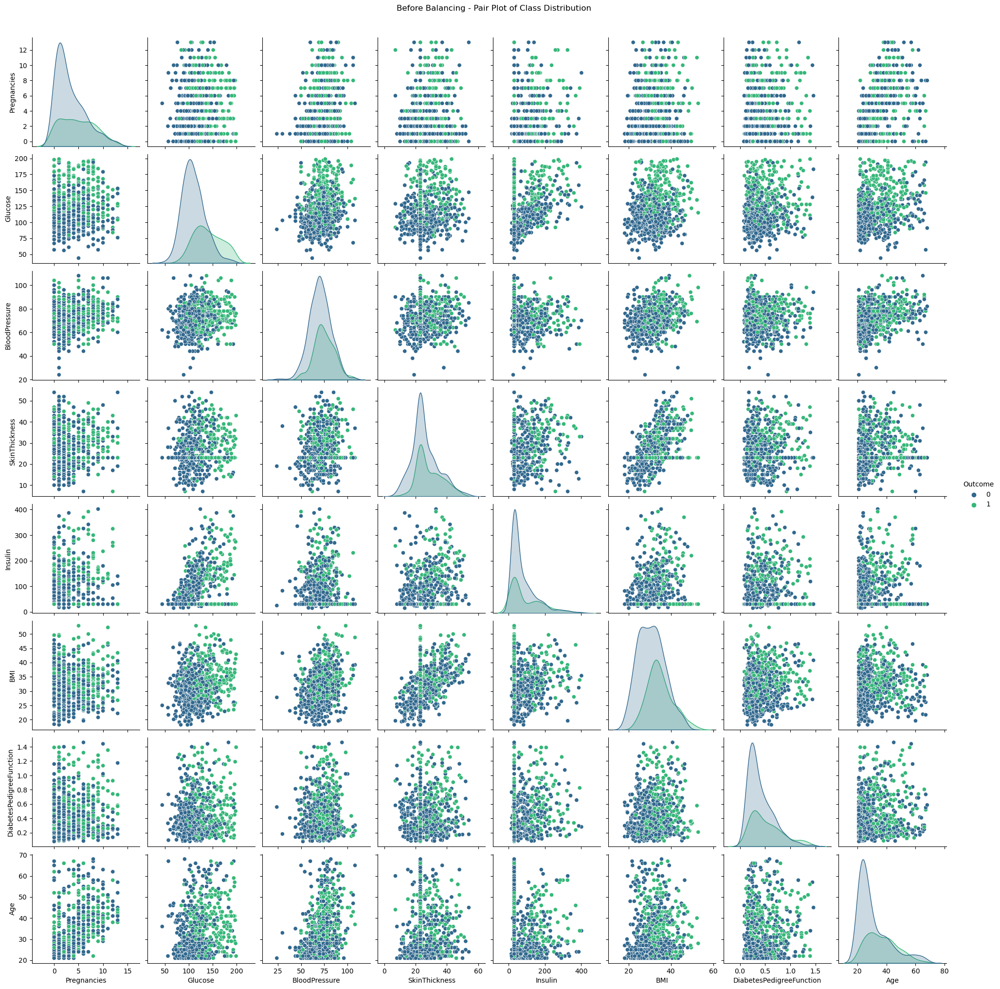

In [42]:
# Visualize class distribution before balancing
sns.pairplot(hc_df, hue="Outcome", palette='viridis')
plt.suptitle('Before Balancing - Pair Plot of Class Distribution', y=1.02)
plt.show()

ADASYN oversampling method

In [43]:
# Apply ADASYN to the entire dataset
adasyn = ADASYN(sampling_strategy='auto', random_state=50)
X_resam_ada, y_resam_ada = adasyn.fit_resample(hc_df.drop('Outcome', axis=1), hc_df['Outcome'])


Check for pair plots after ADASYN sampling

In [44]:
hc_df_ada = pd.concat([X_resam_ada,y_resam_ada],axis=1)

In [45]:
hc_df_ada

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.000000,72.000000,35,30.500000,33.600000,0.627000,50,1
1,1,85.000000,66.000000,29,30.500000,26.600000,0.351000,31,0
2,8,183.000000,64.000000,23,30.500000,23.300000,0.672000,32,1
3,1,89.000000,66.000000,23,94.000000,28.100000,0.167000,21,0
4,5,116.000000,74.000000,23,30.500000,25.600000,0.201000,30,0
...,...,...,...,...,...,...,...,...,...
947,3,127.265826,83.594959,35,111.223623,35.178488,0.848495,37,1
948,1,128.764184,87.617908,39,107.898494,36.356715,0.983352,36,1
949,0,123.724394,69.102422,23,30.500000,34.802918,0.279973,50,1
950,3,189.661079,96.067047,23,30.500000,35.093295,0.331211,57,1


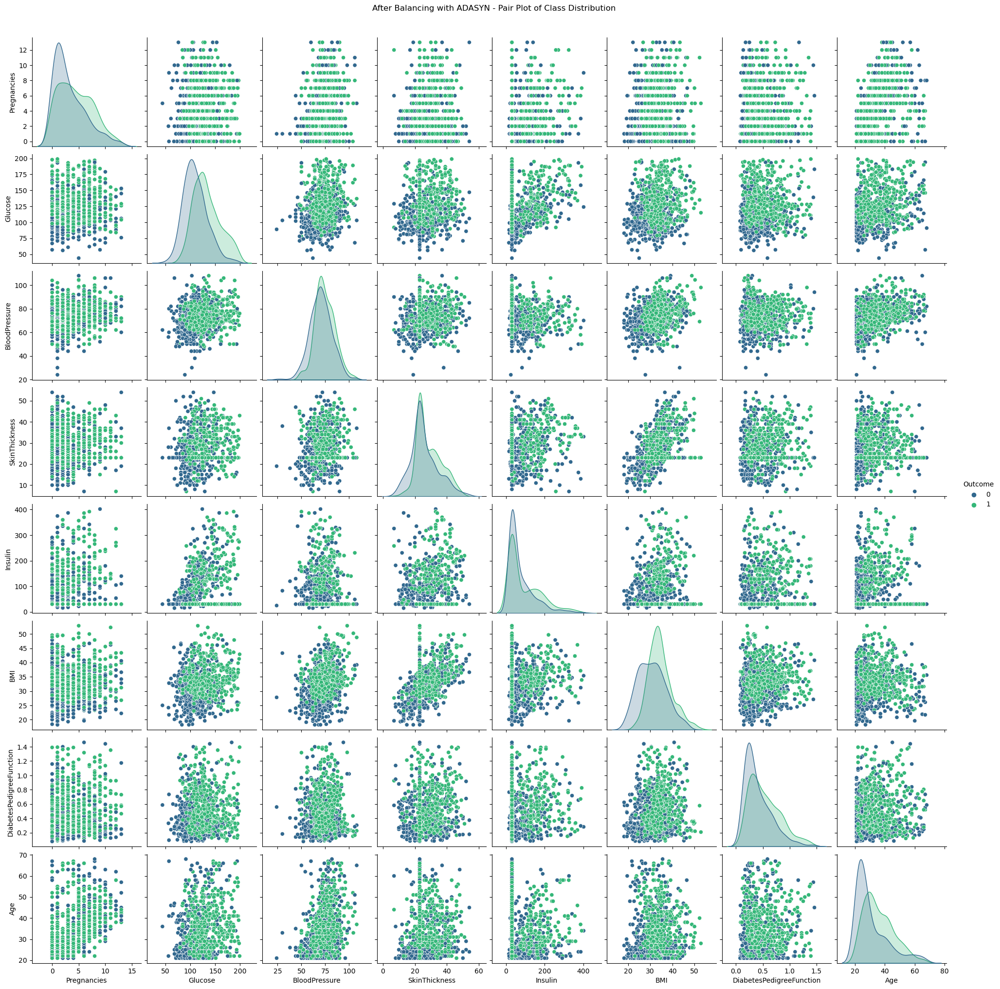

In [46]:
# Visualize class distribution before balancing
sns.pairplot(hc_df_ada, hue="Outcome", palette='viridis')
plt.suptitle('After Balancing with ADASYN - Pair Plot of Class Distribution', y=1.02)
plt.show()

SMOTE sampling method

In [47]:
# Apply ADASYN to the entire dataset
smote = SMOTE(sampling_strategy='auto', random_state=50)
X_resam_smo, y_resam_smo = smote.fit_resample(hc_df.drop('Outcome', axis=1), hc_df['Outcome'])

Check for pair plots after SMOTE sampling

In [48]:
hc_df_smo = pd.concat([X_resam_smo,y_resam_smo],axis=1)

In [49]:
hc_df_smo

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.000000,72.000000,35,30.500000,33.600000,0.627000,50,1
1,1,85.000000,66.000000,29,30.500000,26.600000,0.351000,31,0
2,8,183.000000,64.000000,23,30.500000,23.300000,0.672000,32,1
3,1,89.000000,66.000000,23,94.000000,28.100000,0.167000,21,0
4,5,116.000000,74.000000,23,30.500000,25.600000,0.201000,30,0
...,...,...,...,...,...,...,...,...,...
953,7,186.215990,86.976144,33,221.112186,36.465506,0.554970,40,1
954,7,105.866369,95.668156,34,30.500000,41.697218,0.431334,44,1
955,5,188.221600,65.556800,35,316.826798,33.729801,0.454953,33,1
956,0,191.749127,70.412381,35,280.986270,40.821992,0.779980,25,1


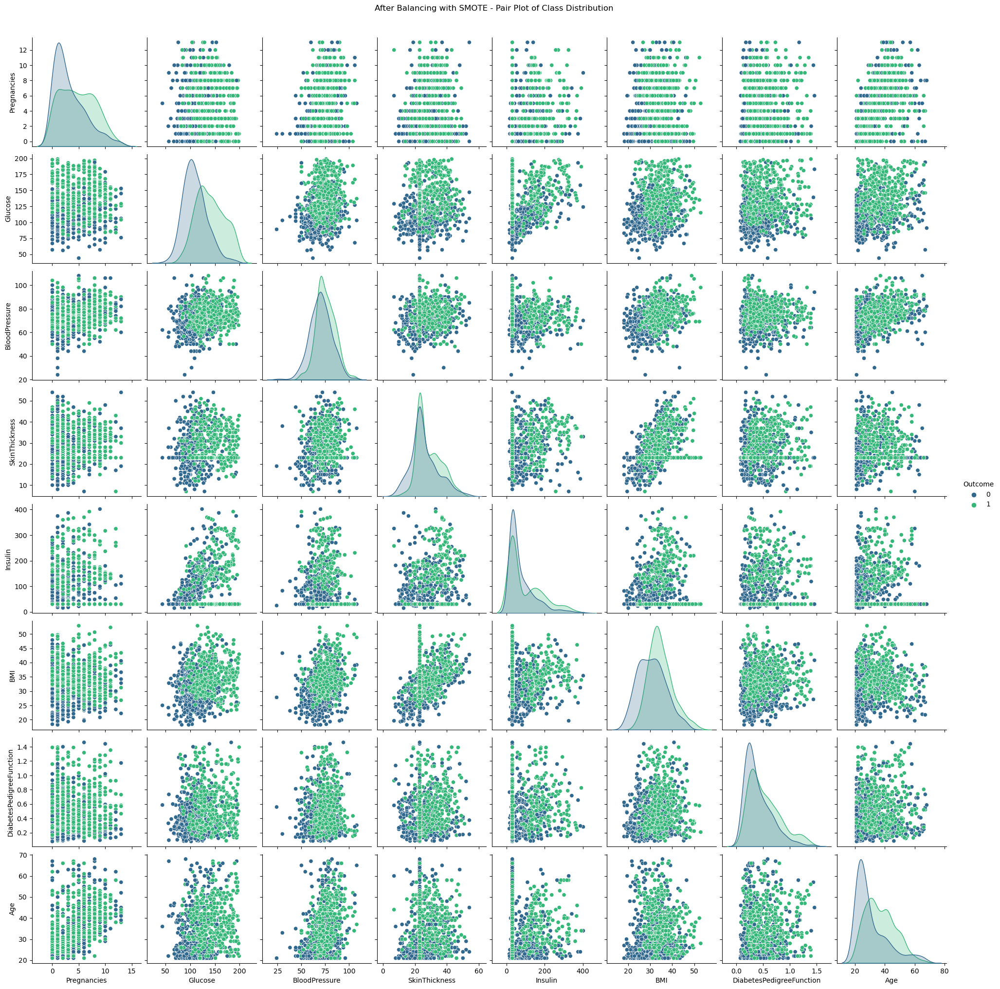

In [50]:
# Visualize class distribution before balancing
sns.pairplot(hc_df_smo, hue="Outcome", palette='viridis')
plt.suptitle('After Balancing with SMOTE - Pair Plot of Class Distribution', y=1.02)
plt.show()

From the two sampling methods we can infer that the data between two sets are almost same, where ADASYN has 952 rows and SMOTE has 958 rows. We can use either. I will proceed with SMOTE one since it hs 7 more data than ADASYN because more data is more information, although it is only 7.

Check for heatmap again after sampling

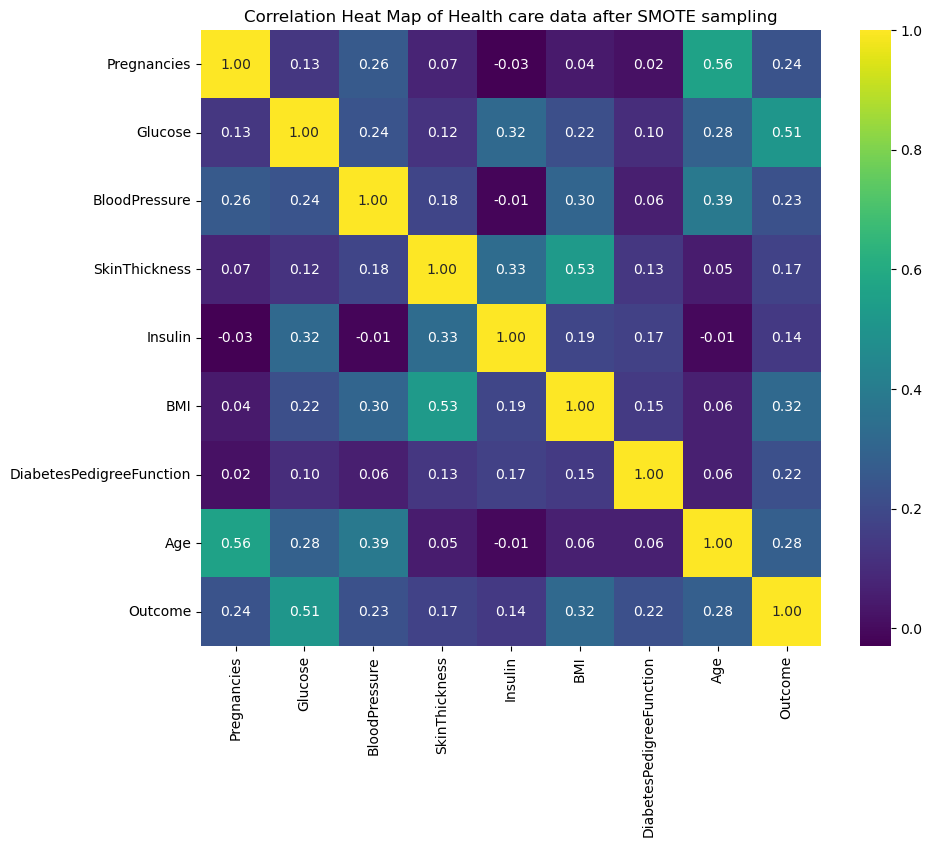

In [51]:
plt.figure(figsize=(10, 8))
sns.heatmap(hc_df_smo.corr(), annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heat Map of Health care data after SMOTE sampling')
plt.show()

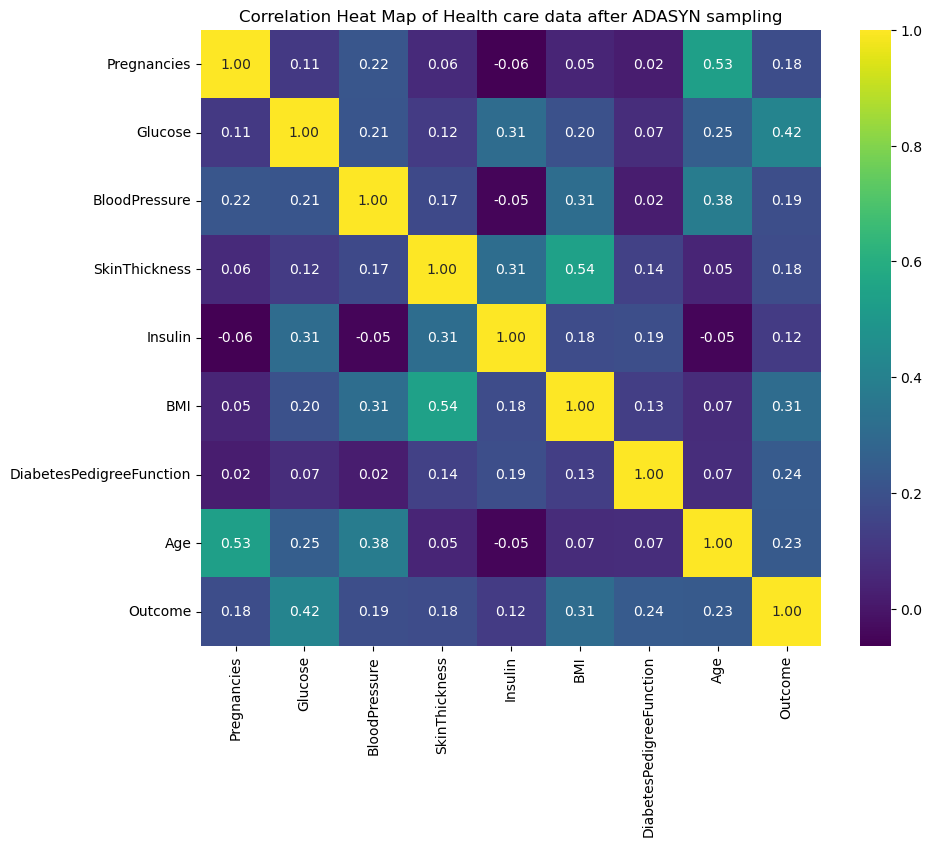

In [52]:
plt.figure(figsize=(10, 8))
sns.heatmap(hc_df_ada.corr(), annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heat Map of Health care data after ADASYN sampling')
plt.show()

SMOTE heatmap has 3 correlated varaibles, while ADASYN and original data have only 2. Not much of a change anyways.

### Data Modelling

1. Devise strategies for model building. It is important to decide 
the right validation framework. Express your thought process.

As this is a dataset to predict if a patient has diabetes or not, so the output is either yes or no which is a classification type.

We can explore several classification algorithms.

Logistic Regression, Decision Trees, Random Forest, Gradient Boosting, Support Vector Machines (SVM), K-Nearest Neighbors (KNN), Naive Bayes, Neural Networks, Voting Classifier, XGBoost.

2. Apply an appropriate classification algorithm to build a model.

3. Compare various models with the results from KNN algorithm.
4. Create a classification report by analyzing sensitivity, specificity, 
   AUC (ROC curve), etc.
   Please be descriptive to explain what values of these 
   parameter you have used.

In [53]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, roc_curve, auc

In [54]:
X = hc_df_smo.drop('Outcome',axis=1)
y = hc_df_smo['Outcome']

In [55]:
X

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.000000,72.000000,35,30.500000,33.600000,0.627000,50
1,1,85.000000,66.000000,29,30.500000,26.600000,0.351000,31
2,8,183.000000,64.000000,23,30.500000,23.300000,0.672000,32
3,1,89.000000,66.000000,23,94.000000,28.100000,0.167000,21
4,5,116.000000,74.000000,23,30.500000,25.600000,0.201000,30
...,...,...,...,...,...,...,...,...
953,7,186.215990,86.976144,33,221.112186,36.465506,0.554970,40
954,7,105.866369,95.668156,34,30.500000,41.697218,0.431334,44
955,5,188.221600,65.556800,35,316.826798,33.729801,0.454953,33
956,0,191.749127,70.412381,35,280.986270,40.821992,0.779980,25


In [56]:
y

0      1
1      0
2      1
3      0
4      0
      ..
953    1
954    1
955    1
956    1
957    1
Name: Outcome, Length: 958, dtype: int64

In [57]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=30)

In [58]:
X_train, X_test

(     Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
 926            9  162.315739      68.526296             24  132.394722   
 76             0  101.000000      65.000000             28   30.500000   
 212            6  134.000000      80.000000             37  370.000000   
 622            9  145.000000      80.000000             46  130.000000   
 238            1  193.000000      50.000000             16  375.000000   
 ..           ...         ...            ...            ...         ...   
 500            1   77.000000      56.000000             30   56.000000   
 813            2  182.104721      78.000000             40  287.108153   
 941            2  129.650850      64.059168             28  115.887523   
 421            2  134.000000      70.000000             23   30.500000   
 805            8  162.607718      69.205788             22  130.593247   
 
            BMI  DiabetesPedigreeFunction  Age  
 926  26.526276                  0.309290   43  


In [59]:
y_train, y_test

(926    1
 76     0
 212    1
 622    1
 238    0
       ..
 500    0
 813    1
 941    1
 421    1
 805    1
 Name: Outcome, Length: 766, dtype: int64,
 585    0
 521    0
 442    0
 378    0
 69     0
       ..
 61     0
 674    0
 896    1
 782    1
 348    0
 Name: Outcome, Length: 192, dtype: int64)

In [60]:
# Initialize classifiers
logistic_regression = LogisticRegression(random_state=30)
decision_tree = DecisionTreeClassifier(random_state=30)
random_forest = RandomForestClassifier(n_estimators=100, random_state=30)
gradient_boosting = GradientBoostingClassifier(random_state=30)
svm_classifier = SVC(probability=True, random_state=30)
knn_classifier = KNeighborsClassifier()
naive_bayes = GaussianNB()
neural_network = MLPClassifier(random_state=30)
xg_boost = XGBClassifier(random_state=30)
voting_classifier = VotingClassifier(estimators=[
    ('lr', logistic_regression),
    ('dt', decision_tree),
    ('rf', random_forest),
    ('gb', gradient_boosting),
    ('svm', svm_classifier),
    ('knn', knn_classifier),
    ('nb', naive_bayes),
    ('nn', neural_network),
    ('xgb', xg_boost)
], voting='soft')

Picking Voting Classifier and XGBoost results on  ROC for comparison. This section of code where getting the results of Voting Classifier and XGBoost are added later after seeing the results of hard and soft voting and comparision of KNN algorithm with other  models

E:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



LogisticRegression:
Accuracy: 0.7291666666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75       104
           1       0.70      0.70      0.70        88

    accuracy                           0.73       192
   macro avg       0.73      0.73      0.73       192
weighted avg       0.73      0.73      0.73       192

AUC-ROC Score: 0.8205


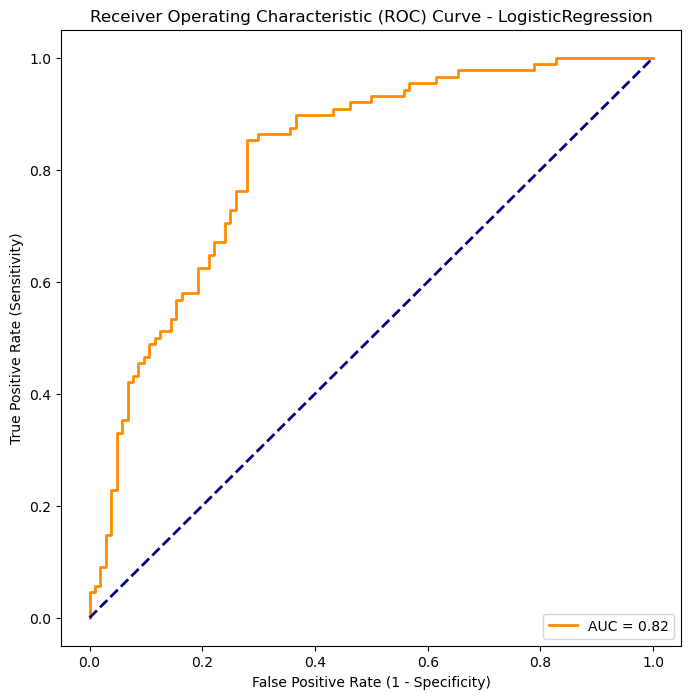


DecisionTreeClassifier:
Accuracy: 0.734375
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.76      0.76       104
           1       0.71      0.70      0.71        88

    accuracy                           0.73       192
   macro avg       0.73      0.73      0.73       192
weighted avg       0.73      0.73      0.73       192

AUC-ROC Score: 0.7321


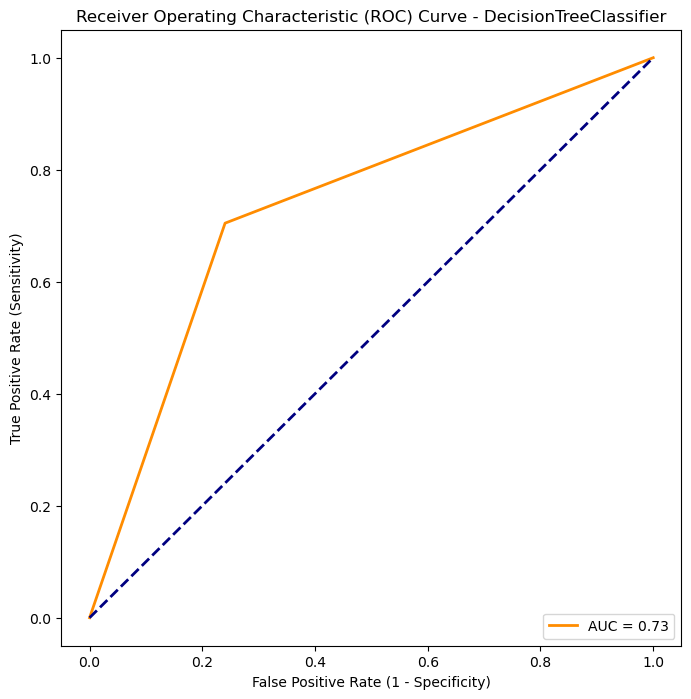


RandomForestClassifier:
Accuracy: 0.7916666666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.80      0.81       104
           1       0.77      0.78      0.78        88

    accuracy                           0.79       192
   macro avg       0.79      0.79      0.79       192
weighted avg       0.79      0.79      0.79       192

AUC-ROC Score: 0.8766


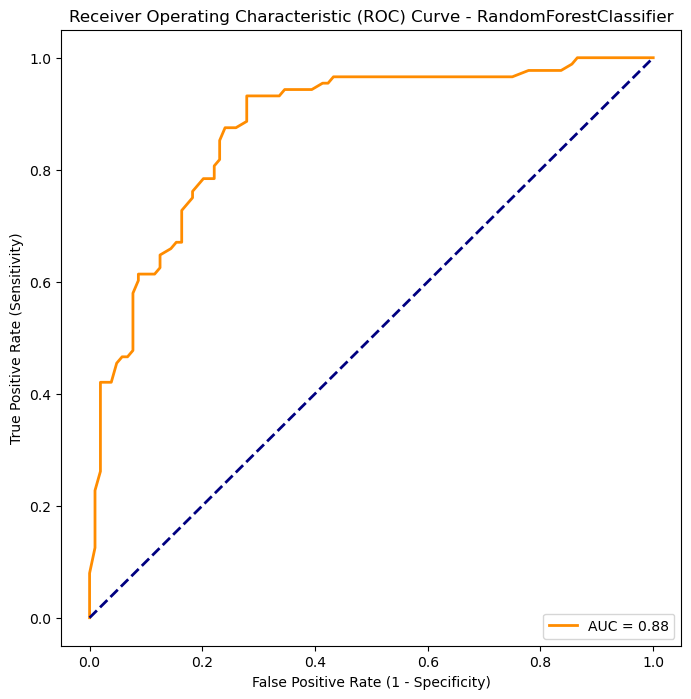


GradientBoostingClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.82      0.82       104
           1       0.79      0.80      0.79        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8615


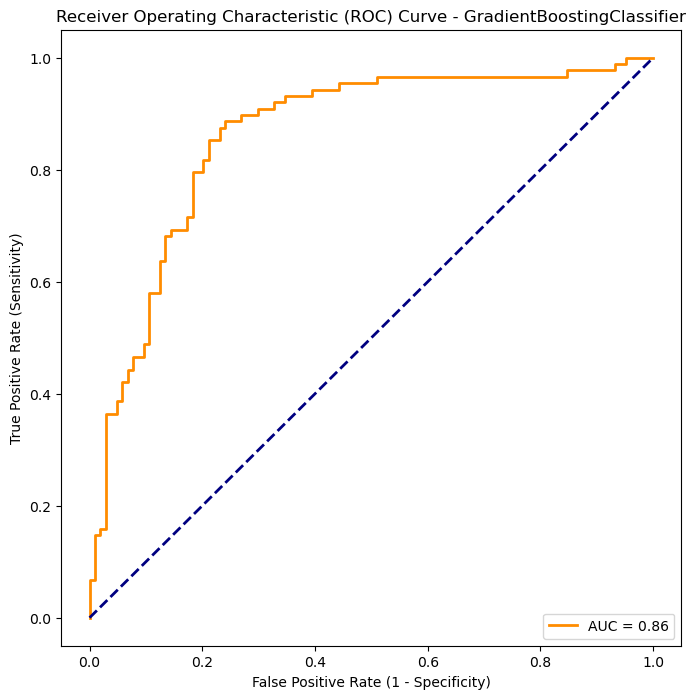


SVC:
Accuracy: 0.75
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.77      0.77       104
           1       0.73      0.73      0.73        88

    accuracy                           0.75       192
   macro avg       0.75      0.75      0.75       192
weighted avg       0.75      0.75      0.75       192

AUC-ROC Score: 0.8242


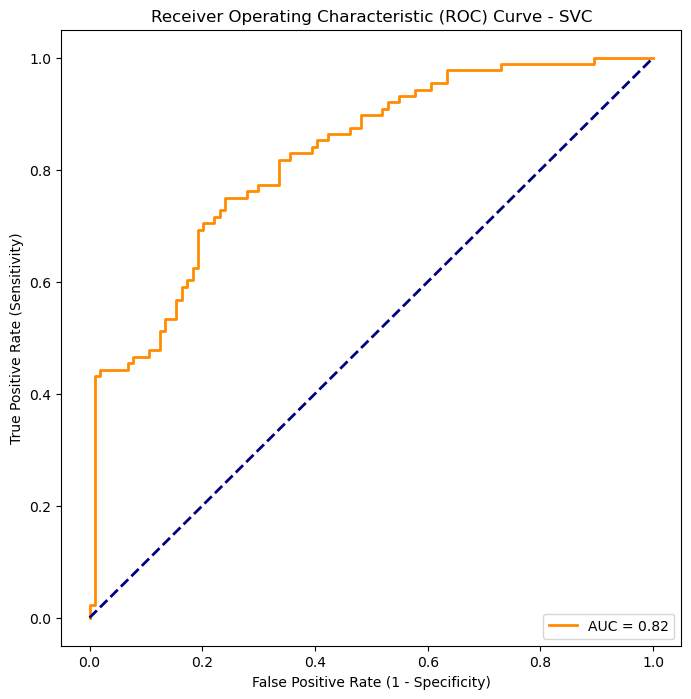


KNeighborsClassifier:
Accuracy: 0.75
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.69      0.75       104
           1       0.69      0.82      0.75        88

    accuracy                           0.75       192
   macro avg       0.76      0.76      0.75       192
weighted avg       0.76      0.75      0.75       192

AUC-ROC Score: 0.8234


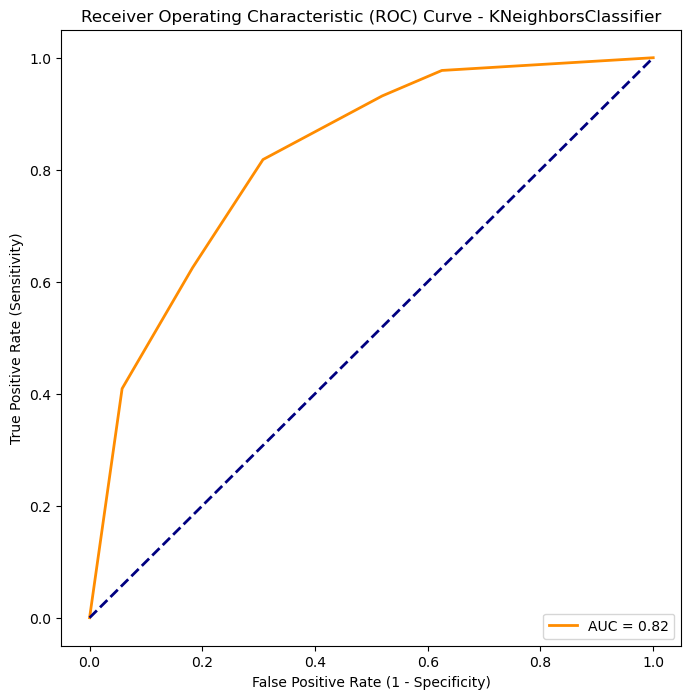


GaussianNB:
Accuracy: 0.78125
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.85      0.81       104
           1       0.79      0.70      0.75        88

    accuracy                           0.78       192
   macro avg       0.78      0.78      0.78       192
weighted avg       0.78      0.78      0.78       192

AUC-ROC Score: 0.8554


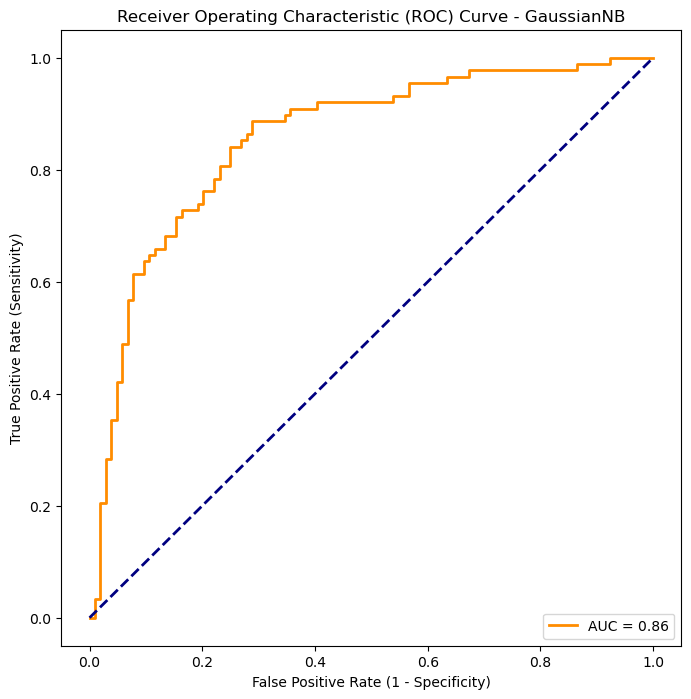


MLPClassifier:
Accuracy: 0.75
Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.70      0.75       104
           1       0.70      0.81      0.75        88

    accuracy                           0.75       192
   macro avg       0.75      0.75      0.75       192
weighted avg       0.76      0.75      0.75       192

AUC-ROC Score: 0.8128


E:\Anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


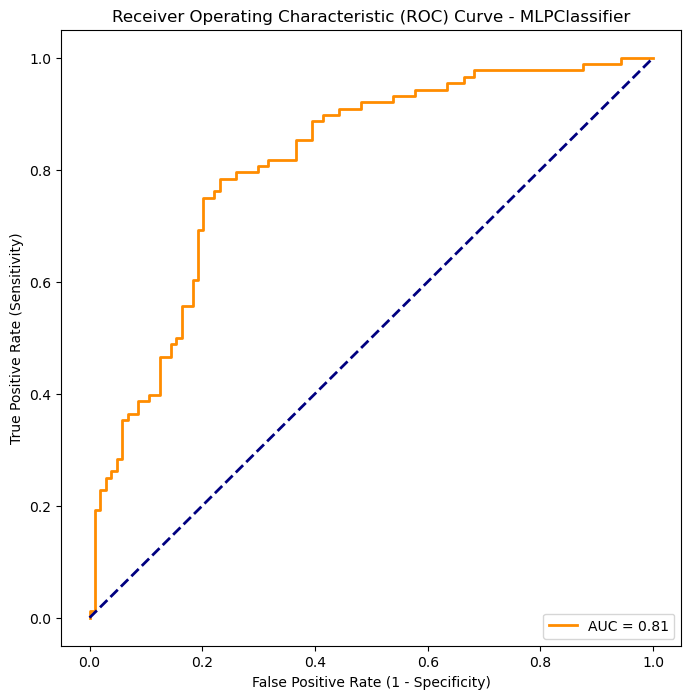


XGBClassifier:
Accuracy: 0.828125
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       104
           1       0.80      0.83      0.82        88

    accuracy                           0.83       192
   macro avg       0.83      0.83      0.83       192
weighted avg       0.83      0.83      0.83       192

AUC-ROC Score: 0.8682


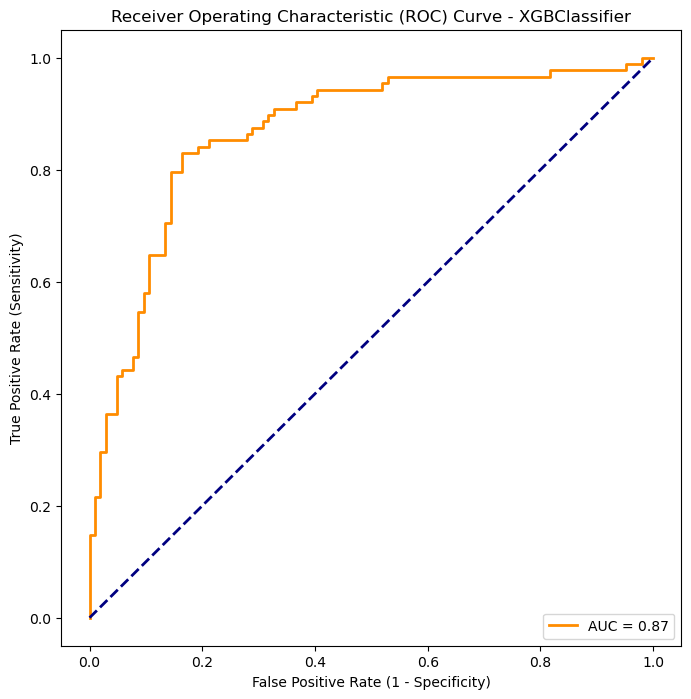

E:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
E:\Anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



VotingClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8789


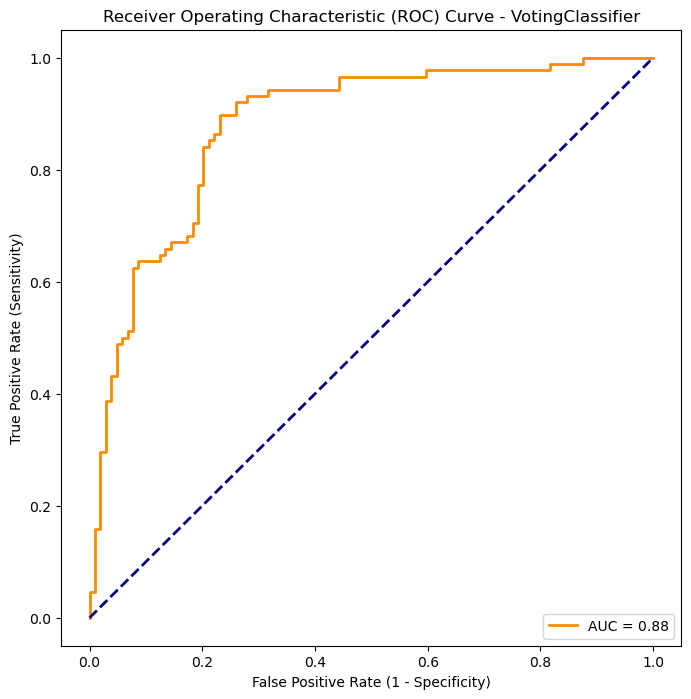

In [61]:
# Train and evaluate each model
models_df =  pd.DataFrame(columns = ['Model','Accuracy','AUC'])
i = 0
for model in [logistic_regression, decision_tree, random_forest, gradient_boosting, svm_classifier, knn_classifier, naive_bayes, neural_network, xg_boost, voting_classifier]:
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None  # Probability of positive class for AUC-ROC
    models_df.loc[i,'Model'] = model.__class__.__name__
    models_df.loc[i,'Accuracy'] = accuracy_score(y_test, y_pred)
   
    print(f"\n{model.__class__.__name__}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    if y_proba is not None:
        auc_roc = roc_auc_score(y_test, y_proba)
        models_df.loc[i,'AUC'] = auc_roc
        print(f"AUC-ROC Score: {auc_roc:.4f}")
        
        # Plot ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_proba)
        roc_auc = auc(fpr, tpr)
        
        if model.__class__.__name__ =='VotingClassifier':
            voting_proba  = y_proba
            voting_y_pred = y_pred
            voting_auc_roc = auc_roc
            voting_fpr = fpr
            voting_tpr = tpr
            voting_roc_auc = roc_auc
        elif model.__class__.__name__ =='XGBClassifier':
            xgb_proba  = y_proba
            xgb_y_pred = y_pred
            xgb_auc_roc = auc_roc
            xgb_fpr = fpr
            xgb_tpr = tpr
            xgb_roc_auc = roc_auc
        
        plt.figure(figsize=(8, 8))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlabel('False Positive Rate (1 - Specificity)')
        plt.ylabel('True Positive Rate (Sensitivity)')
        plt.title(f'Receiver Operating Characteristic (ROC) Curve - {model.__class__.__name__}')
        plt.legend(loc='lower right')
        plt.show()
    else:
        print("AUC-ROC Score: Not applicable for this model.")
    i+=1
    

View of models and their Accuracy and AUC

In [62]:
models_df

,Model,Accuracy,AUC
0,LogisticRegression,0.729167,0.820476
1,DecisionTreeClassifier,0.734375,0.73208
2,RandomForestClassifier,0.791667,0.876584
3,GradientBoostingClassifier,0.807292,0.861451
4,SVC,0.75,0.824191
5,KNeighborsClassifier,0.75,0.823427
6,GaussianNB,0.78125,0.855441
7,MLPClassifier,0.75,0.812828
8,XGBClassifier,0.828125,0.868226
9,VotingClassifier,0.807292,0.878934


Sorting the models on Accuracy, high to low

In [63]:
models_df.sort_values(by=['Accuracy'],ascending=False)

,Model,Accuracy,AUC
8,XGBClassifier,0.828125,0.868226
3,GradientBoostingClassifier,0.807292,0.861451
9,VotingClassifier,0.807292,0.878934
2,RandomForestClassifier,0.791667,0.876584
6,GaussianNB,0.78125,0.855441
4,SVC,0.75,0.824191
5,KNeighborsClassifier,0.75,0.823427
7,MLPClassifier,0.75,0.812828
1,DecisionTreeClassifier,0.734375,0.73208
0,LogisticRegression,0.729167,0.820476


Sorting the models on AUC, high to low

In [64]:
models_df.sort_values(by=['AUC'],ascending=False)

,Model,Accuracy,AUC
9,VotingClassifier,0.807292,0.878934
2,RandomForestClassifier,0.791667,0.876584
8,XGBClassifier,0.828125,0.868226
3,GradientBoostingClassifier,0.807292,0.861451
6,GaussianNB,0.78125,0.855441
4,SVC,0.75,0.824191
5,KNeighborsClassifier,0.75,0.823427
0,LogisticRegression,0.729167,0.820476
7,MLPClassifier,0.75,0.812828
1,DecisionTreeClassifier,0.734375,0.73208


KNN's accuracy is 0.75

and from sorting we find that <br>
XGBoost has 0.828125 <br>
Gradient Boost has	0.807292 <br>
Voting Classifier has 0.807292

KNN's AUC is 0.823427

Voting Classifier has 0.878934 <br>
Random Forest Classifier has 0.876584 <br>
XGBoost has 0.868226

Compared to KNN's results, we can see that Voting Classifier and XGBoost having more accuracy and area under the curve.

Lets try Voting Classifier with hard voting

In [65]:
logistic_regression = LogisticRegression(random_state=30)
decision_tree = DecisionTreeClassifier(random_state=30)
random_forest = RandomForestClassifier(n_estimators=100, random_state=30)
gradient_boosting = GradientBoostingClassifier(random_state=30)
svm_classifier = SVC(probability=True, random_state=30)
knn_classifier = KNeighborsClassifier()
naive_bayes = GaussianNB()
neural_network = MLPClassifier(random_state=30)
xg_boost = XGBClassifier(random_state=30)
voting_classifier_h = VotingClassifier(estimators=[
    ('lr', logistic_regression),
    ('dt', decision_tree),
    ('rf', random_forest),
    ('gb', gradient_boosting),
    ('svm', svm_classifier),
    ('knn', knn_classifier),
    ('nb', naive_bayes),
    ('nn', neural_network),
    ('xgb', xg_boost)
], voting='hard')

E:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



LogisticRegression:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8205


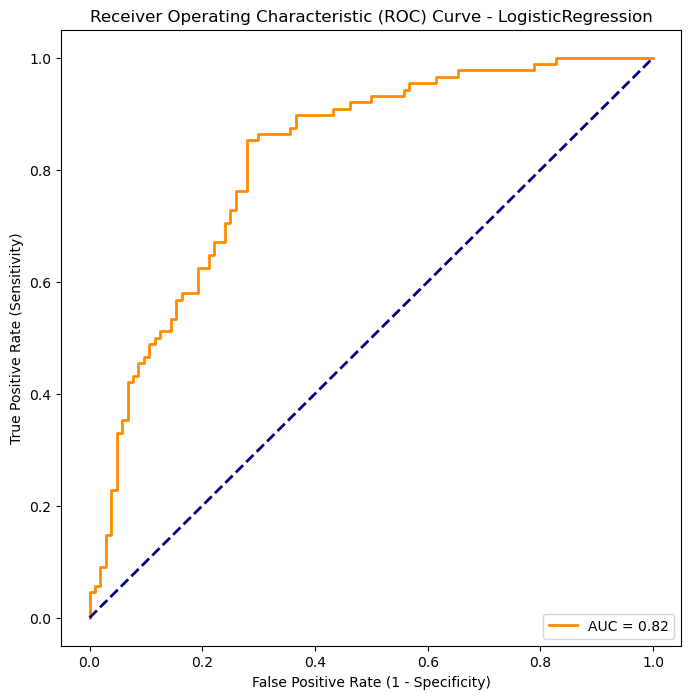


DecisionTreeClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.7321


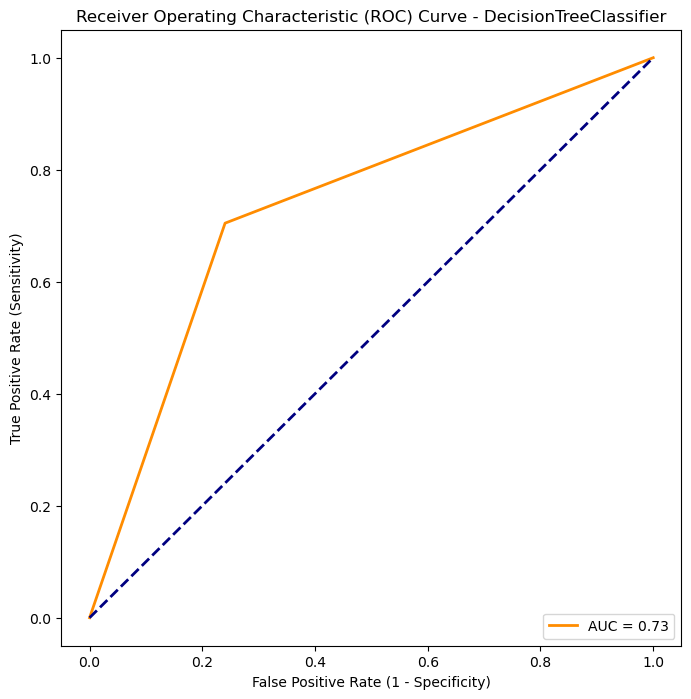


RandomForestClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8766


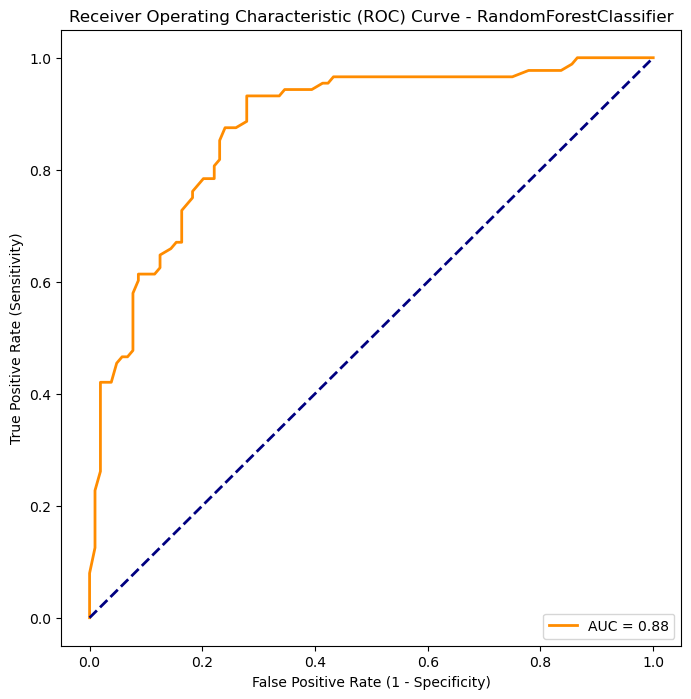


GradientBoostingClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8615


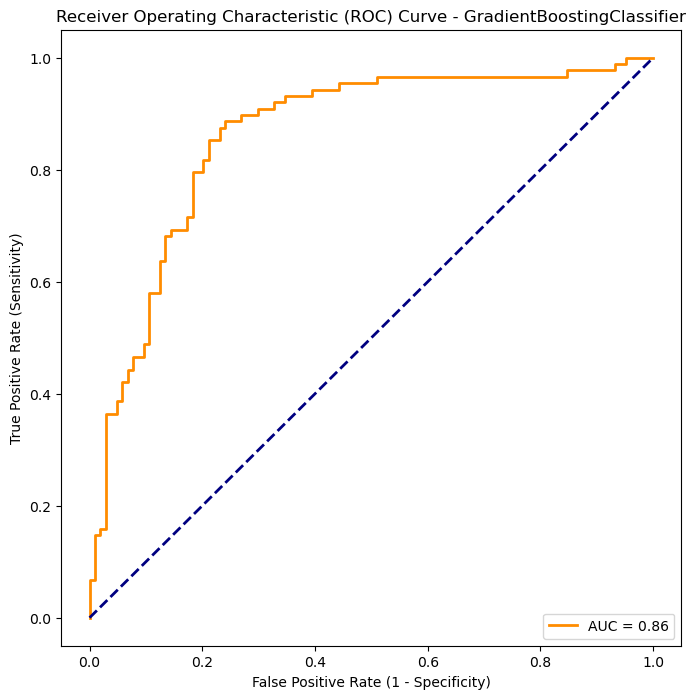


SVC:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8242


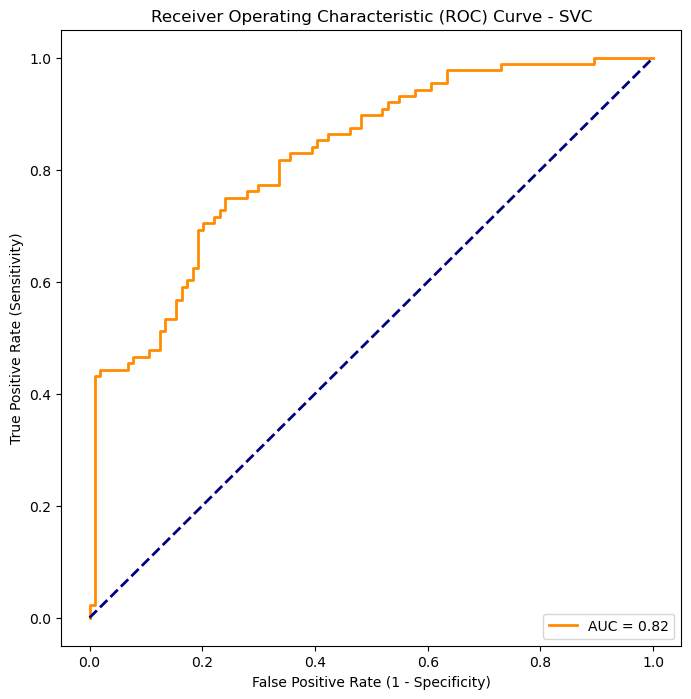


KNeighborsClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8234


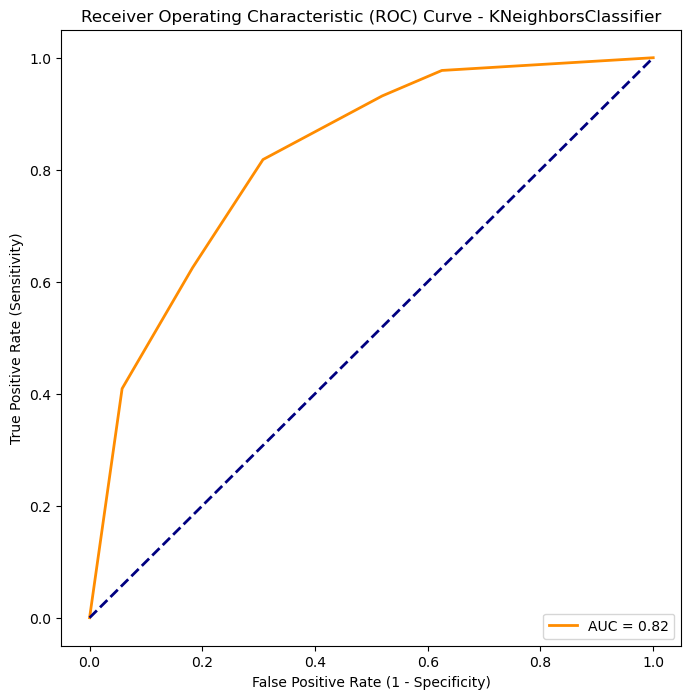


GaussianNB:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8554


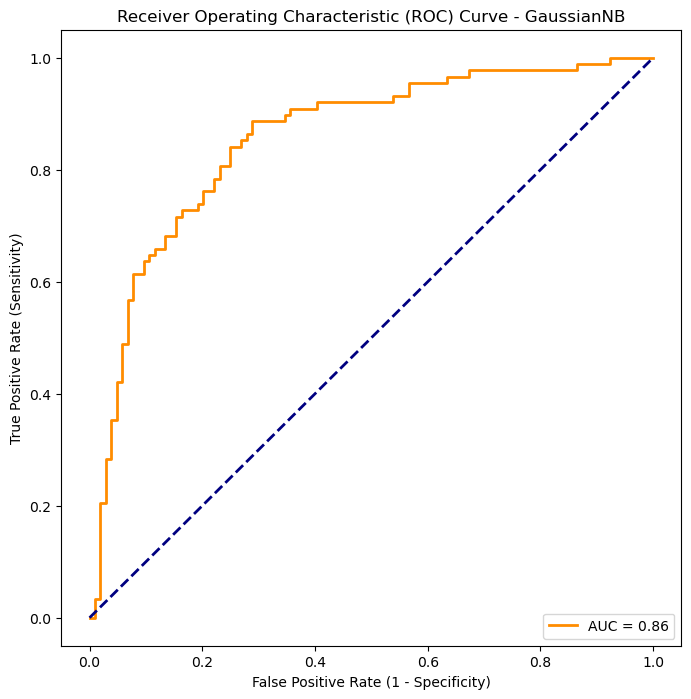

E:\Anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



MLPClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8128


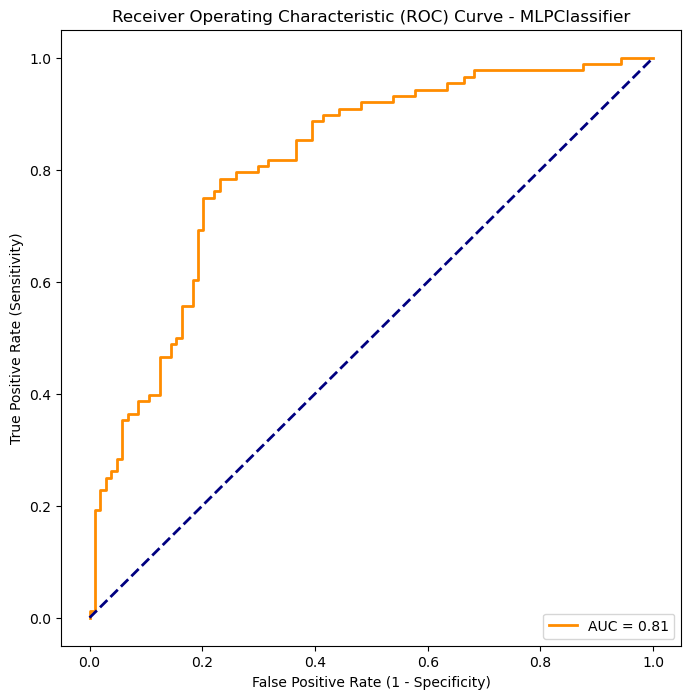


XGBClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: 0.8682


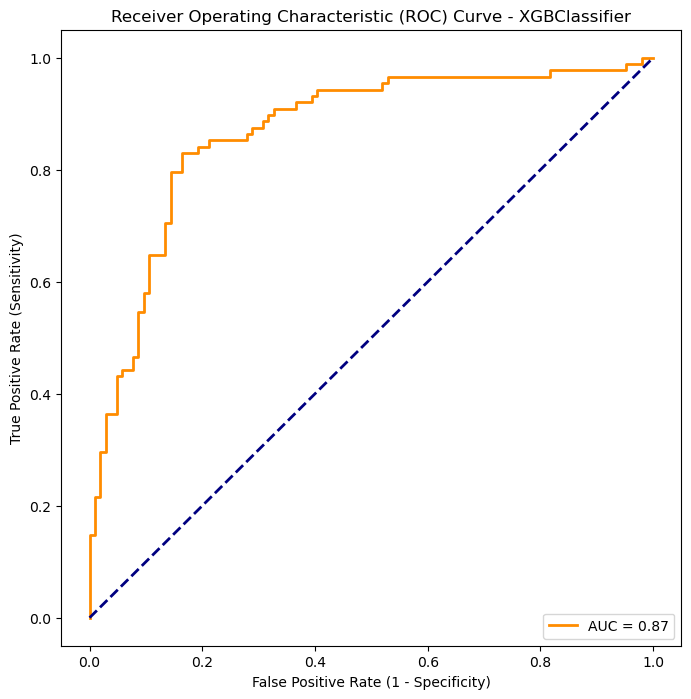

E:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
E:\Anaconda\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



VotingClassifier:
Accuracy: 0.8072916666666666
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82       104
           1       0.77      0.82      0.80        88

    accuracy                           0.81       192
   macro avg       0.81      0.81      0.81       192
weighted avg       0.81      0.81      0.81       192

AUC-ROC Score: Not applicable for this model.


In [66]:
# Train and evaluate each model for hard voting
models_h_df =  pd.DataFrame(columns = ['Model','Accuracy','AUC'])
i = 0
for model_h in [logistic_regression, decision_tree, random_forest, gradient_boosting, svm_classifier, knn_classifier, naive_bayes, neural_network, xg_boost, voting_classifier_h]:
    
    model_h.fit(X_train, y_train)
    y_pred_h = model_h.predict(X_test)
    y_proba_h = model_h.predict_proba(X_test)[:, 1] if hasattr(model_h, 'predict_proba') else None  # Probability of positive class for AUC-ROC
    models_h_df.loc[i,'Model'] = model_h.__class__.__name__
    models_h_df.loc[i,'Accuracy'] = accuracy_score(y_test, y_pred_h)
    
    print(f"\n{model_h.__class__.__name__}:")
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    
    if y_proba_h is not None:
        auc_roc_h = roc_auc_score(y_test, y_proba_h)
        models_h_df.loc[i,'AUC'] = auc_roc_h
        print(f"AUC-ROC Score: {auc_roc_h:.4f}")
        
        # Plot ROC curve
        fpr, tpr, _ = roc_curve(y_test, y_proba_h)
        roc_auc_h = auc(fpr, tpr)
        plt.figure(figsize=(8, 8))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc_h:.2f}')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlabel('False Positive Rate (1 - Specificity)')
        plt.ylabel('True Positive Rate (Sensitivity)')
        plt.title(f'Receiver Operating Characteristic (ROC) Curve - {model_h.__class__.__name__}')
        plt.legend(loc='lower right')
        plt.show()
    else:
        print("AUC-ROC Score: Not applicable for this model.")
    i+=1

In [67]:
models_h_df

,Model,Accuracy,AUC
0,LogisticRegression,0.729167,0.820476
1,DecisionTreeClassifier,0.734375,0.73208
2,RandomForestClassifier,0.791667,0.876584
3,GradientBoostingClassifier,0.807292,0.861451
4,SVC,0.75,0.824191
5,KNeighborsClassifier,0.75,0.823427
6,GaussianNB,0.78125,0.855441
7,MLPClassifier,0.75,0.812828
8,XGBClassifier,0.828125,0.868226
9,VotingClassifier,0.807292,NaN


In [68]:
models_h_df.sort_values(by=['Accuracy'],ascending=False)

,Model,Accuracy,AUC
8,XGBClassifier,0.828125,0.868226
3,GradientBoostingClassifier,0.807292,0.861451
9,VotingClassifier,0.807292,NaN
2,RandomForestClassifier,0.791667,0.876584
6,GaussianNB,0.78125,0.855441
4,SVC,0.75,0.824191
5,KNeighborsClassifier,0.75,0.823427
7,MLPClassifier,0.75,0.812828
1,DecisionTreeClassifier,0.734375,0.73208
0,LogisticRegression,0.729167,0.820476


In [69]:
models_h_df.sort_values(by=['AUC'],ascending=False)

,Model,Accuracy,AUC
2,RandomForestClassifier,0.791667,0.876584
8,XGBClassifier,0.828125,0.868226
3,GradientBoostingClassifier,0.807292,0.861451
6,GaussianNB,0.78125,0.855441
4,SVC,0.75,0.824191
5,KNeighborsClassifier,0.75,0.823427
0,LogisticRegression,0.729167,0.820476
7,MLPClassifier,0.75,0.812828
1,DecisionTreeClassifier,0.734375,0.73208
9,VotingClassifier,0.807292,NaN


When voting is set to hard for Voting Classifier, probability prediction is None, hence we will proceed with soft voting

Compared to Voting Classifier, XGBosst has 2% more accuracy  and AUC differs by only 0.8%, its not much of a differnce

Plotting Voting Classifier and XGBoost

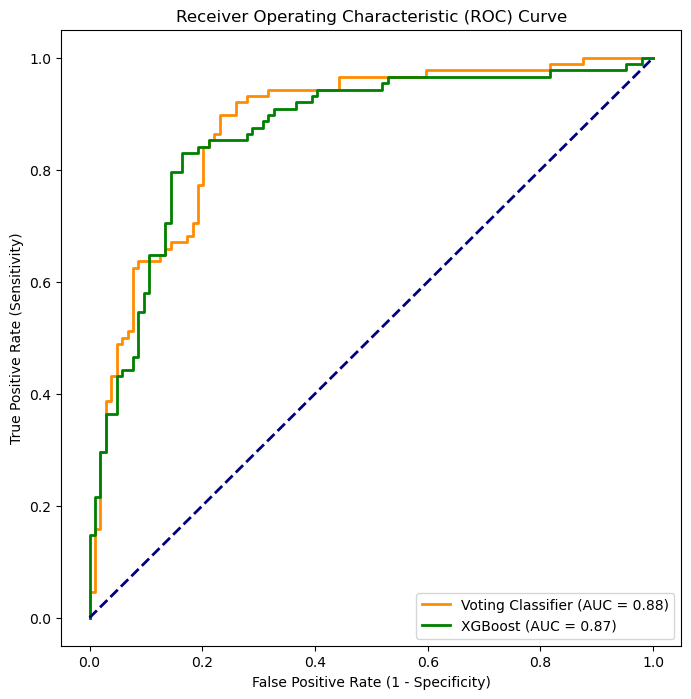

In [70]:
plt.figure(figsize=(8, 8))

plt.plot(voting_fpr, voting_tpr, color='darkorange', lw=2, label=f'Voting Classifier (AUC = {voting_roc_auc:.2f})')
plt.plot(xgb_fpr, xgb_tpr, color='green', lw=2, label=f'XGBoost (AUC = {xgb_roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

We can see there is not much difference between these 2 classifiers in AUC and XGBoost having 2% more accuracy we will go with it.

As it is decided XGBoost is the model, I will hypterune it further to try to increase the accuracy

Hypertuning

In [71]:
from sklearn.model_selection import GridSearchCV

In [72]:
# Assuming you have X_train and y_train
param_grid = {
    'n_estimators': [50, 100, 200,300,400,500],
    'learning_rate':  [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 7, 9, 11, 13]
}

In [73]:
grid_search = GridSearchCV(xg_boost, param_grid, cv=3, scoring='roc_auc')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=30, ...),
             param_grid={'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3],
                         'max_depth': [3, 5, 7, 9, 11, 13],
                         'n_estimators': [50, 100, 200, 300, 400, 500]},
             scoring='roc_auc')

In [74]:
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 13, 'n_estimators': 50}


Feature Importance

In [75]:
# Assuming xgb_model is your trained XGBoost model
feature_importance = xg_boost.feature_importances_

In [76]:
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

print("Top Features:")
print(feature_importance_df.head())

Top Features:
                    Feature  Importance
1                   Glucose    0.274087
7                       Age    0.149660
0               Pregnancies    0.108466
5                       BMI    0.107630
6  DiabetesPedigreeFunction    0.095346


Cross Validation

In [77]:
from sklearn.model_selection import cross_val_score

# Assuming xgb_model is your trained XGBoost model
cv_scores = cross_val_score(xg_boost, X_train, y_train, cv=5, scoring='roc_auc')

# Display cross-validation scores
print("Cross-Validation Scores:", cv_scores)

Cross-Validation Scores: [0.88877637 0.8574359  0.83760684 0.83128205 0.8974359 ]


Model Interpretability

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


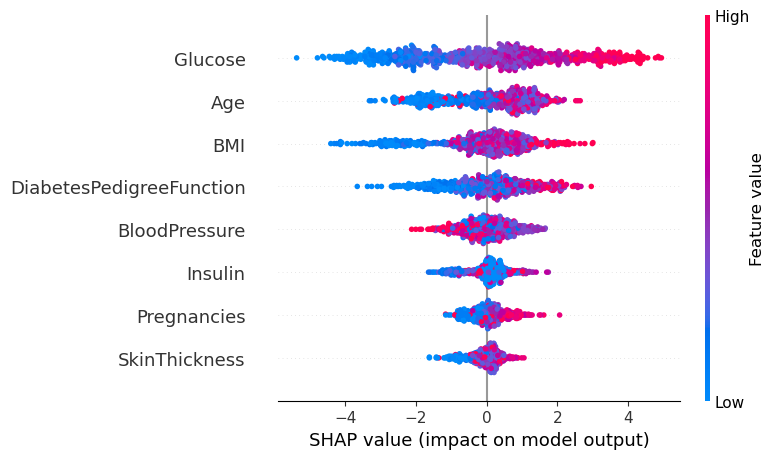

In [78]:
import shap

# Assuming xgb_model is your trained XGBoost model
explainer = shap.TreeExplainer(xg_boost)
shap_values = explainer.shap_values(X_train)

# Summary plot
shap.summary_plot(shap_values, X_train)

From the above,
Hypertuning - Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50}
so I will set the model to these parameters to these values.

We can also see the top important features, meaning these features have influence on the output and how much they have

Glucose    27.4087%<br>
Age    14.9660%<br>
Pregnancies    10.8466%<br>
BMI    10.7630%<br>
DiabetesPedigreeFunction    9.5346%

In [79]:
xg_boost_final = XGBClassifier(learning_rate= 0.33, max_depth= 13, n_estimators= 500,random_state=30)

In [80]:
xg_boost_final.fit(X_train, y_train)
y_pred_final = xg_boost_final.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred_final))
print("Classification Report:")
print(classification_report(y_test, y_pred_final))

Accuracy: 0.8177083333333334
Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.82      0.83       104
           1       0.79      0.82      0.80        88

    accuracy                           0.82       192
   macro avg       0.82      0.82      0.82       192
weighted avg       0.82      0.82      0.82       192



In [81]:
xg_boost.fit(X_train, y_train)
y_pred = xg_boost.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.828125
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.83      0.84       104
           1       0.80      0.83      0.82        88

    accuracy                           0.83       192
   macro avg       0.83      0.83      0.83       192
weighted avg       0.83      0.83      0.83       192



From the above comparison of two xg boost models, xg_boost_final and xg_boost, after several tries of manipulating depth, estimators and learning rate ((learning_rate= 0.33, max_depth= 13, n_estimators= 500) come close to xg_boost's accuracy. So I will stick wtih xg_boost model.

### Creating Correlation matrix for Tableau

In [82]:
hc_df_smo_corr_mat =  hc_df_smo.corr()

In [83]:
hc_df_smo_corr_mat.unstack()

Pregnancies  Pregnancies                 1.000000
             Glucose                     0.133235
             BloodPressure               0.257719
             SkinThickness               0.071449
             Insulin                    -0.029602
                                           ...   
Outcome      Insulin                     0.141226
             BMI                         0.316764
             DiabetesPedigreeFunction    0.222251
             Age                         0.279055
             Outcome                     1.000000
Length: 81, dtype: float64

In [84]:
hc_corr_mat = hc_df_smo.corr().unstack().to_frame().reset_index().rename({'level_0':'Variable 1','level_1':'Variable 2', 0:'Correlation' }, axis =1)

In [85]:
hc_corr_mat

,Variable 1,Variable 2,Correlation
0,Pregnancies,Pregnancies,1.000000
1,Pregnancies,Glucose,0.133235
2,Pregnancies,BloodPressure,0.257719
3,Pregnancies,SkinThickness,0.071449
4,Pregnancies,Insulin,-0.029602
...,...,...,...
76,Outcome,Insulin,0.141226
77,Outcome,BMI,0.316764
78,Outcome,DiabetesPedigreeFunction,0.222251
79,Outcome,Age,0.279055


In [86]:
hc_corr_mat.to_csv('healthcare_corr_pivot.csv', index = False)

### Conclusion

From the comparison between several models with KNN it is decided that XGBoost model has relatively more accuracy and AUC than ohter models. Then further hypertuning of XBGoost was tried to increase accuracy but it was achievable till 82%, which is a good number.